# Initial setup

This analysis using ema is based on the work of Enayat A. Moallemi created on 22 May 2018 at the Fraunhofer ISI, Karlsruhe. In that instance, the analysis was done for the MATISSE model.
This notebook  has been modified to:
- Use EMA workbench scenario discovery tools with GR4SP model
    - Open exploration for each output of interest
    - PRIM and other directed search algorithms to study three transitions scenarios low carbon (LCT), just (JT), and sustainable (ST))
- Include PRIM helper functions to identigy the input settings for the scenarios achieving the targets

In [1]:
"""
Based on Enayat A. Moallemi version from May 2018

edited by Angela M. Rojas A. <angelara@student.unimelb.edu.au>

Created on February 2020

"""

import sys
import os

sys.path.append(r'C:\Users\angel\Documents\GitHub\gr4sp\experiments\EMAworkbench')

sys.path.append(r'C:\Users\angel\Documents\GitHub\gr4sp\experiments')

#from ema_workbench.analysis.plotting_util import BOXPLOT, KDE, VIOLIN
from ema_workbench.analysis.plotting import envelopes
import matplotlib.pyplot as plt
import numpy as np

import pandas as pd
import matplotlib.cm as cm
import seaborn as sns
from ema_workbench.analysis import prim
#import pareto
import os
import glob
import numpy as np
import pandas as pd
import os
import glob
import datetime as DT




C:\Users\angel\Anaconda3\lib\importlib\_bootstrap.py:219: ImportWarning:

can't resolve package from __spec__ or __package__, falling back on __name__ and __path__



## Load the results

In [2]:
from ema_workbench import load_results

#results = load_results(r'C:\Users\angel\Documents\GitHub\gr4sp\experiments\data\gr4sp_2020-Feb-20-years.tar.gz')
#results = load_results(r'C:\Users\angel\Documents\GitHub\gr4sp\experiments\data\gr4sp_2020-Feb-07_EET_allV3.tar.gz')
#results = load_results(r'C:\Users\angel\Documents\GitHub\gr4sp\experiments\data\gr4sp_2020-Feb-25-LHS.tar.gz')
#results = load_results(r'C:/Users/angel/Documents/GitHub/gr4sp/experiments/simulationData/gr4sp_EET2020-Oct-05.tar.gz')
results = load_results(r'C:/Users/angel/Documents/GitHub/gr4sp/experiments/simulationData/gr4sp_SOBOL2021-Feb-03.tar.gz')



In [3]:
experiments, outcomes = results
experiments.describe()

,annualCpi,annualInflation,consumption,domesticConsumptionPercentage,energyEfficiency,generationRolloutPeriod,generatorRetirement,importPriceFactor,includePublicallyAnnouncedGen,learningCurve,...,priceChangePercentageBrownCoal,priceChangePercentageOcgt,priceChangePercentageWater,priceChangePercentageWind,rooftopPV,scheduleMinCapMarketGen,semiScheduleGenSpotMarket,semiScheduleMinCapMarketGen,solarUptake,wholesaleTariffContribution
count,126000.000000,126000.000000,126000.000000,126000.000000,126000.000000,126000.000000,126000.000000,126000.000000,126000.000000,126000.000000,...,126000.000000,126000.000000,126000.000000,126000.000000,126000.000000,126000.000000,126000.000000,126000.000000,126000.000000,126000.000000
mean,3.000238,2.998810,1.999048,34.990000,1.000714,5.497143,-0.001429,-0.007143,0.500000,7.497143,...,-0.018333,0.006190,0.005000,0.000714,5.999524,150.541905,8.998333,150.370476,2.001429,27.503810
std,1.415313,1.415313,1.414556,8.939456,0.816645,2.872126,3.161913,29.152702,0.500002,4.609583,...,29.153567,29.154507,29.151743,29.152674,0.816208,86.593375,0.816061,86.599359,1.414892,10.387143
min,1.000000,1.000000,0.000000,20.000000,0.000000,1.000000,-5.000000,-50.000000,0.000000,0.000000,...,-50.000000,-50.000000,-50.000000,-50.000000,5.000000,1.000000,8.000000,1.000000,0.000000,10.000000
25%,2.000000,2.000000,1.000000,27.000000,0.000000,3.000000,-3.000000,-25.000000,0.000000,3.750000,...,-25.000000,-25.000000,-25.000000,-25.000000,5.000000,75.750000,8.000000,75.750000,1.000000,18.750000
50%,3.000000,3.000000,2.000000,35.000000,1.000000,5.500000,0.000000,0.000000,0.500000,7.500000,...,0.000000,0.000000,0.000000,0.000000,6.000000,150.500000,9.000000,150.500000,2.000000,27.500000
75%,4.000000,4.000000,3.000000,43.000000,2.000000,8.000000,3.000000,25.000000,1.000000,11.250000,...,25.000000,25.000000,25.000000,25.000000,7.000000,225.250000,10.000000,225.250000,3.000000,36.250000
max,5.000000,5.000000,4.000000,50.000000,2.000000,10.000000,5.000000,50.000000,1.000000,15.000000,...,50.000000,50.000000,50.000000,50.000000,7.000000,300.000000,10.000000,300.000000,4.000000,45.000000


## Load Energy Vulnerability

In [4]:
# Energy vulnerability results
ev_results_df = pd.read_excel(r'C:/Users/angel/Documents/GitHub/gr4sp/experiments/notebookGr4sp/outputs/data/EV_all.xlsx', index_col=[0])

In [7]:
# Duplicate results from 2040 into the years of 2040-2050

ev_results_df.insert(0, 1998, ev_results_df[2000])
ev_results_df.insert(0, 1999, ev_results_df[2000])
for t in range(2041,2051):
     ev_results_df[t] = ev_results_df[2040]
        
# Add it to outcomes data structure
outcomes['Energy Vulnerability Percentage'] = ev_results_df.values

In [8]:
# Energy vulnerability results
ev_results_df_bau = pd.read_excel(r'C:/Users/angel/Documents/GitHub/gr4sp/experiments/notebookGr4sp/outputs/data/EV_oneScenario.xlsx', index_col=[0,1,2])

# Aggregate desagregated groups into a total parcentage
ev_bau = ev_results_df_bau.mean()

ev_bau_98_99 = pd.DataFrame(data=[ev_bau[2000],ev_bau[2000]],index=[1998,1999])
ev_bau_full = pd.concat([ev_bau_98_99, ev_bau], axis=0)

# Duplicate results from 2040 into the years of 2040-2050
for t in range(2041,2051):
     ev_bau_full.loc[t] = ev_bau_full.loc[2040]
        
outcomes['Energy Vulnerability Percentage'] = np.append(outcomes['Energy Vulnerability Percentage'],
                                                 [ev_bau_full.T.values[0]], axis=0)

## Load BAU

In [9]:
bau_scenario_id = max(experiments['scenario']) + 1

new_row = pd.DataFrame({'annualCpi': 2.33, 'annualInflation': 3.3, 'importPriceFactor': 29, 'nameplateCapacityChangeBrownCoal': 0,
       'nameplateCapacityChangeWater': 0,'nameplateCapacityChangeBattery': 0,
        'nameplateCapacityChangeSolar': 0, 'nameplateCapacityChangeWind': 0,
        'nameplateCapacityChangeOcgt': 0, 'consumption': 0, 'energyEfficiency': 0,
       'generationRolloutPeriod':1, 'generatorRetirement':0,
       'includePublicallyAnnouncedGen':0, 'learningCurve':5,
       'nonScheduleGenSpotMarket': 10, 'nonScheduleMinCapMarketGen':1,
       'priceChangePercentageBrownCoal':0, 'priceChangePercentageOcgt':0,
       'priceChangePercentageWater':0, 'priceChangePercentageWind':0, 'priceChangePercentageBattery':0, 'rooftopPV':7,
       'domesticConsumptionPercentage':30,
       'scheduleMinCapMarketGen':300, 'semiScheduleGenSpotMarket':8,
       'semiScheduleMinCapMarketGen':300, 'solarUptake':0,
        'wholesaleTariffContribution':28.37, 'scenario': bau_scenario_id,
       'policy': "None", 'model': 'Gr4sp'}, index =[0]) 
# simply concatenate both dataframes 
experiments = pd.concat([experiments,new_row],sort=True).reset_index(drop = True) 

# rename none in policy column into constant value 0. PRIM fails otherwise.
if "None" in experiments["policy"].unique():
    experiments["policy"] = experiments["policy"].replace("None",int(0))

In [10]:
#Results for BAU were generated with the 'light' setting in the model.
bau_results_df = pd.read_csv(r'C:/Users/angel/Documents/GitHub/gr4sp/experiments/simulationData/VICSimDataYearSummary_160221-BAU-1998-2051.csv')
bau_results_df.head()

,Time (Year),Consumption (KWh) per household,Avg Tariff (c/KWh) per household,Primary Wholesale ($/MWh),GHG Emissions (tCO2-e) per household,Number of Domestic Consumers (households),Percentage Renewable Production,System Production Primary Spot,System Production Secondary Spot,System Production Off Spot,...,285000 - Battery - Gannawarra Energy Storage System - 25.33 - S - 2020 - 2033 - OffSpot,293000 - Wind - Berrybank Wind Farm - 180.6 - SS - 2020 - 2050 - Primary,295000 - Wind - Moorabool Wind Farm - 320.32 - SS - 2020 - 2044 - Primary,297000 - Wind - Stockyard Hill Wind Farm - 531.93 - SS - 2020 - 2045 - Primary,301000 - Wind - Cherry Tree Wind Farm - 57.6 - SS - 2020 - 2050 - Primary,303000 - Solar - Carwarp Solar Farm - Stage I - 100.0 - SS - 2020 - 2050 - Primary,305000 - Wind - Dundonnell Wind Farm - 336.0 - SS - 2020 - 2045 - Primary,308000 - Wind - Mortlake South Wind Farm - 157.5 - SS - 2020 - 2050 - Primary,317000 - Solar - Winton Asset Co. Pty Ltd as Trustee of the Winton Asset Trust - 85.0 - SS - 2021 - 2051 - Primary,331000 - Solar - Kiamal Solar Farm - Stage 2 - 149.96 - SS - 2022 - 2052 - Primary
0,1998,7274.621326,26.621281,0.000000,9.241233,1637917.0,0.019037,0.000000e+00,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1999,7972.760042,23.351999,17.529518,10.169690,1666850.0,0.024080,4.417793e+07,0.0,443764.080000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2000,8336.261405,14.290676,25.878248,10.462258,1695784.0,0.034438,4.693226e+07,0.0,444979.872000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2001,8225.690958,15.696864,22.072247,10.284990,1724718.0,0.035015,4.694292e+07,0.0,592307.850000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2002,8195.767319,10.385764,25.678888,10.154013,1753652.0,0.041821,4.746060e+07,0.0,752769.978226,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [11]:
# #This cell adds BAU trajectory from 1998-2019. To add 1998 to 2050, comment this cell and uncomment the one below

# seed_bau = bau_scenario_id + 1
# outcomes['TIMEYear'] = np.append(outcomes['TIMEYear'],
#                                           [bau_results_df['Time (Year)'].values[:22]], axis=0)
# outcomes['consumptionYear'] = np.append(outcomes['consumptionYear'],
#                                                  [bau_results_df['Consumption (KWh) per household'].values[:22]], axis=0)
# outcomes['tariffsYear'] = np.append(outcomes['tariffsYear'],
#                                                  [bau_results_df['Avg Tariff (c/KWh) per household'].values[:22]], axis=0)
# outcomes['wholesalePriceYear'] = np.append(outcomes['wholesalePriceYear'],
#                                                  [bau_results_df['Primary Wholesale ($/MWh)'].values[:22]], axis=0)
# outcomes['GHGYear'] = np.append(outcomes['GHGYear'],
#                                                  [bau_results_df['GHG Emissions (tCO2-e) per household'].values[:22]], axis=0)
# outcomes['numConsumersYear'] = np.append(outcomes['numConsumersYear'],
#                                                  [bau_results_df['Number of Domestic Consumers (households)'].values[:22]], axis=0)
# outcomes['primarySpotProductionYear'] = np.append(outcomes['primarySpotProductionYear'],
#                                                  [bau_results_df['System Production Primary Spot'].values[:22]], axis=0)
# outcomes['secondarySpotProductionYear'] = np.append(outcomes['secondarySpotProductionYear'],
#                                                  [bau_results_df['System Production Secondary Spot'].values[:22]], axis=0)
# outcomes['offSpotProductionYear'] = np.append(outcomes['offSpotProductionYear'],
#                                                  [bau_results_df['System Production Off Spot'].values[:22]], axis=0)
# outcomes['renewableContributionYear'] = np.append(outcomes['renewableContributionYear'],
#                                                  [bau_results_df['Percentage Renewable Production'].values[:22]], axis=0)
# outcomes['rooftopPVProductionYear'] = np.append(outcomes['rooftopPVProductionYear'],
#                                                  [bau_results_df['System Production Rooftop PV'].values[:22]], axis=0)
# outcomes['coalProductionYear'] = np.append(outcomes['coalProductionYear'],
#                                                  [bau_results_df['System Production Coal'].values[:22]], axis=0)
# outcomes['windProductionYear'] = np.append(outcomes['windProductionYear'],
#                                                  [bau_results_df['System Production Wind'].values[:22]], axis=0)
# outcomes['gasProductionYear'] = np.append(outcomes['gasProductionYear'],
#                                                  [bau_results_df['System Production Gas'].values[:22]], axis=0)
# outcomes['solarProductionYear'] = np.append(outcomes['solarProductionYear'],
#                                                  [bau_results_df['System Production Solar'].values[:22]], axis=0)   
# outcomes['waterProductionYear'] = np.append(outcomes['waterProductionYear'],
#                                                  [bau_results_df['System Production Water'].values[:22]], axis=0)
# outcomes['BatteryProductionYear'] = np.append(outcomes['BatteryProductionYear'],
#                                                  [bau_results_df['System Production Battery'].values[:22]], axis=0)
# outcomes['numActorsYear'] = np.append(outcomes['numActorsYear'],
#                                                  [bau_results_df['Number of Active Actors'].values[:22]], axis=0)
# outcomes['primaryUnmetDemandMwh'] = np.append(outcomes['primaryUnmetDemandMwh'],
#                                                  [bau_results_df['Primary Total Unmet Demand (MWh)'].values[:22]], axis=0)
# outcomes['primaryUnmetDemandHours'] = np.append(outcomes['primaryUnmetDemandHours'],
#                                                  [bau_results_df['Primary Total Unmet Demand (Hours)'].values[:22]], axis=0)
# outcomes['primaryUnmetDemandDays'] = np.append(outcomes['primaryUnmetDemandDays'],
#                                                  [bau_results_df['Primary Total Unmet Demand (Days)'].values[:22]], axis=0)
# outcomes['primaryMaxUnmetDemandMwhPerHour'] = np.append(outcomes['primaryMaxUnmetDemandMwhPerHour'],
#                                                  [bau_results_df['Primary Max Unmet Demand Per Hour (MWh)'].values[:22]], axis=0)
# outcomes['secondaryUnmetDemandMwh'] = np.append(outcomes['secondaryUnmetDemandMwh'],
#                                                  [bau_results_df['Secondary Total Unmet Demand (MWh)'].values[:22]], axis=0)
# outcomes['secondaryUnmetDemandHours'] = np.append(outcomes['secondaryUnmetDemandHours'],
#                                                  [bau_results_df['Secondary Total Unmet Demand (Hours)'].values[:22]], axis=0)
# outcomes['secondaryUnmetDemandDays'] = np.append(outcomes['secondaryUnmetDemandDays'],
#                                                  [bau_results_df['Secondary Total Unmet Demand (Days)'].values[:22]], axis=0)
# outcomes['secondaryMaxUnmetDemandMwhPerHour'] = np.append(outcomes['secondaryMaxUnmetDemandMwhPerHour'],
#                                                  [bau_results_df['Secondary Max Unmet Demand Per Hour (MWh)'].values[:22]], axis=0)
                                          
# outcomes['seedExperimentCsv'] = np.append(outcomes['seedExperimentCsv'], [seed_bau], axis=0)


In [12]:
seed_bau = bau_scenario_id + 1
outcomes['TIMEYear'] = np.append(outcomes['TIMEYear'],
                                          [bau_results_df['Time (Year)'].values], axis=0)
outcomes['consumptionYear'] = np.append(outcomes['consumptionYear'],
                                                 [bau_results_df['Consumption (KWh) per household'].values], axis=0)
outcomes['tariffsYear'] = np.append(outcomes['tariffsYear'],
                                                 [bau_results_df['Avg Tariff (c/KWh) per household'].values], axis=0)
outcomes['wholesalePriceYear'] = np.append(outcomes['wholesalePriceYear'],
                                                 [bau_results_df['Primary Wholesale ($/MWh)'].values], axis=0)
outcomes['GHGYear'] = np.append(outcomes['GHGYear'],
                                                 [bau_results_df['GHG Emissions (tCO2-e) per household'].values], axis=0)
outcomes['numConsumersYear'] = np.append(outcomes['numConsumersYear'],
                                                 [bau_results_df['Number of Domestic Consumers (households)'].values], axis=0)
outcomes['primarySpotProductionYear'] = np.append(outcomes['primarySpotProductionYear'],
                                                 [bau_results_df['System Production Primary Spot'].values], axis=0)
outcomes['secondarySpotProductionYear'] = np.append(outcomes['secondarySpotProductionYear'],
                                                 [bau_results_df['System Production Secondary Spot'].values], axis=0)
outcomes['offSpotProductionYear'] = np.append(outcomes['offSpotProductionYear'],
                                                 [bau_results_df['System Production Off Spot'].values], axis=0)
outcomes['renewableContributionYear'] = np.append(outcomes['renewableContributionYear'],
                                                 [bau_results_df['Percentage Renewable Production'].values], axis=0)
outcomes['rooftopPVProductionYear'] = np.append(outcomes['rooftopPVProductionYear'],
                                                 [bau_results_df['System Production Rooftop PV'].values], axis=0)
outcomes['coalProductionYear'] = np.append(outcomes['coalProductionYear'],
                                                 [bau_results_df['System Production Coal'].values], axis=0)
outcomes['windProductionYear'] = np.append(outcomes['windProductionYear'],
                                                 [bau_results_df['System Production Wind'].values], axis=0)
outcomes['gasProductionYear'] = np.append(outcomes['gasProductionYear'],
                                                 [bau_results_df['System Production Gas'].values], axis=0)
outcomes['solarProductionYear'] = np.append(outcomes['solarProductionYear'],
                                                 [bau_results_df['System Production Solar'].values], axis=0)   
outcomes['waterProductionYear'] = np.append(outcomes['waterProductionYear'],
                                                 [bau_results_df['System Production Water'].values], axis=0)
outcomes['BatteryProductionYear'] = np.append(outcomes['BatteryProductionYear'],
                                                 [bau_results_df['System Production Battery'].values], axis=0)
outcomes['numActorsYear'] = np.append(outcomes['numActorsYear'],
                                                 [bau_results_df['Number of Active Actors'].values], axis=0)
outcomes['primaryUnmetDemandMwh'] = np.append(outcomes['primaryUnmetDemandMwh'],
                                                 [bau_results_df['Primary Total Unmet Demand (MWh)'].values], axis=0)
outcomes['primaryUnmetDemandHours'] = np.append(outcomes['primaryUnmetDemandHours'],
                                                 [bau_results_df['Primary Total Unmet Demand (Hours)'].values], axis=0)
outcomes['primaryUnmetDemandDays'] = np.append(outcomes['primaryUnmetDemandDays'],
                                                 [bau_results_df['Primary Total Unmet Demand (Days)'].values], axis=0)
outcomes['primaryMaxUnmetDemandMwhPerHour'] = np.append(outcomes['primaryMaxUnmetDemandMwhPerHour'],
                                                 [bau_results_df['Primary Max Unmet Demand Per Hour (MWh)'].values], axis=0)
outcomes['secondaryUnmetDemandMwh'] = np.append(outcomes['secondaryUnmetDemandMwh'],
                                                 [bau_results_df['Secondary Total Unmet Demand (MWh)'].values], axis=0)
outcomes['secondaryUnmetDemandHours'] = np.append(outcomes['secondaryUnmetDemandHours'],
                                                 [bau_results_df['Secondary Total Unmet Demand (Hours)'].values], axis=0)
outcomes['secondaryUnmetDemandDays'] = np.append(outcomes['secondaryUnmetDemandDays'],
                                                 [bau_results_df['Secondary Total Unmet Demand (Days)'].values], axis=0)
outcomes['secondaryMaxUnmetDemandMwhPerHour'] = np.append(outcomes['secondaryMaxUnmetDemandMwhPerHour'],
                                                 [bau_results_df['Secondary Max Unmet Demand Per Hour (MWh)'].values], axis=0)

outcomes['seedExperimentCsv'] = np.append(outcomes['seedExperimentCsv'], [seed_bau], axis=0)


## General parameters

In [13]:
outcomes['PrimarySpot-WholesalePriceYear'] = outcomes['wholesalePriceYear']

outcomes_to_show = ['consumptionYear', 'tariffsYear', 'PrimarySpot-WholesalePriceYear', 'GHGYear', 
                    'numConsumersYear', 'primarySpotProductionYear', 'secondarySpotProductionYear', 
                    'offSpotProductionYear', 'renewableContributionYear', 'rooftopPVProductionYear', 
                    'coalProductionYear', 'waterProductionYear', 'windProductionYear', 'gasProductionYear', 
                    'solarProductionYear', 'BatteryProductionYear', 'numActorsYear', 'primaryUnmetDemandMwh', 
                    'primaryUnmetDemandHours', 'primaryUnmetDemandDays', 'primaryMaxUnmetDemandMwhPerHour', 
                    'secondaryUnmetDemandMwh', 'secondaryUnmetDemandHours', 'secondaryUnmetDemandDays', 
                    'secondaryMaxUnmetDemandMwhPerHour']

# 23 levers/uncertainties selected after EET (last test July 2020)
# 25 uncertainties selected aftet EET including change on domestic demand and unmet demand output (August 2020)
uncertainties = experiments.columns[:-3]

#from startYear
startYear = 2000
startYearShift = (startYear - 1998)

time = outcomes['TIMEYear'][0, startYearShift:]

points_of_interest = [*range(2020,2051,10)] 
#points_of_interest = [*range(2000,2019,5)] 

points_of_interest = [ x - startYear for x in points_of_interest]

# Filter outcomes taking into account the startYear, and removing Seed Experiment info. 
# Seed it is useful if I want to retrieve more info from the csv files, or redo the experiments with the
# simulation parameters
outcomes_filtered = {k:v[:, startYearShift:] for k,v in outcomes.items() if k != 'seedExperimentCsv'}


## Aggregate Household data

GHG emissions and Consumption per household type converted to total sector


In [14]:
ooi = 'GHGYear'
data_GHG_household = outcomes_filtered[ooi]

In [15]:
""" Converts household data in tCO2e into total residential data in MtCO2e"""
data_GHG_residential = (data_GHG_household * outcomes_filtered['numConsumersYear']) / 1000000.0
data_GHG_residential_bau = (bau_results_df['GHG Emissions (tCO2-e) per household'] * bau_results_df['Number of Domestic Consumers (households)']) / 1000000.0

""" Applies scaling factor used in simulation, so that data represents total emissions, not only residential (30%)"""
data_GHG_total = data_GHG_residential / 0.3
data_GHG_total_bau = data_GHG_residential_bau / 0.3


"""Overwrite GHG with the data of interest"""
outcomes_filtered[ooi] = data_GHG_total
bau_results_df[ooi] = data_GHG_total_bau

In [16]:
ooi = 'consumptionYear'
data_consumption_household = outcomes_filtered[ooi]

In [17]:
""" Converts household data in KWh into total residential data in MWh"""
data_consumption_residential = (data_consumption_household * outcomes_filtered['numConsumersYear']) / 1000.0

""" Applies scaling factor used in simulation, so that data represents total consumption, not only residential"""
data_consumption_total = data_consumption_residential / 0.3

"""Overwrite Consumption with the data of interest"""
outcomes_filtered[ooi] = data_consumption_total

## Create Percentage of Unmet Consumption

In [18]:
primary = outcomes_filtered['primarySpotProductionYear']
secondary = outcomes_filtered['secondarySpotProductionYear']
off = outcomes_filtered['offSpotProductionYear']
unmetPrimary = outcomes_filtered['primaryUnmetDemandMwh']
unmetSecondary = outcomes_filtered['secondaryUnmetDemandMwh']

consumptionPrimary = primary + off + unmetPrimary
consumptionSecondary = secondary + off + unmetSecondary

percentageUnmetPrimary = (unmetPrimary/consumptionPrimary)*100
percentageUnmetSecondary = (unmetSecondary/consumptionSecondary)*100

    
where_are_NaNs = np.isnan(percentageUnmetPrimary)
percentageUnmetPrimary[where_are_NaNs] = 0

where_are_NaNs = np.isnan(percentageUnmetSecondary)
percentageUnmetSecondary[where_are_NaNs] = 0

outcomes_filtered['unmetPercentageConsumptionPrimary'] = percentageUnmetPrimary
outcomes_filtered['unmetPercentageConsumptionSecondary'] = percentageUnmetSecondary

# Target functions

In [19]:
def target_always_after(outcomes,ooi,targetYear,targetVal,above):
    data = outcomes[ooi]
    num_exp = len(data)
    achieved = np.zeros(num_exp, dtype=bool)

    for i in range(num_exp):
        achieved[i] = False
        exp_run = data[i]
        for j in range( len(exp_run) ):
            if (startYear + j) >= targetYear:
                if above is True:
                    achieved[i] = exp_run[j] >= targetVal
                else:
                    achieved[i] = exp_run[j] < targetVal
                    
                #If the target is not achieved after the TargetYear, then mark experiment as False
                if achieved[i] == False:
                    break
    return achieved

def target_at_year(outcomes,ooi,targetYear,targetVal,above):
    data = outcomes[ooi]
    num_exp = len(data)
    achieved = np.zeros(num_exp, dtype=bool)

    for i in range(num_exp):
        achieved[i] = False
        exp_run = data[i]
        
        idx = targetYear - startYear
        if above is True:
            achieved[i] = exp_run[idx] >= targetVal
        else:
            achieved[i] = exp_run[idx] < targetVal                        
                
    return achieved

# PRIM Helper Functions

In [20]:
def BoxExperimentsScores( box1, selected_box, y, allinputsScore = False ):
    # Get limits from box
    qps = [(key, value) for key, value in box1.qp[selected_box].items()]
    relevantInputs = [key for key, value in box1.qp[selected_box].items()]

    box_lim = {}
    for inputFactor, qp in qps:
        values = box1.box_lims[selected_box][inputFactor]
        box_lim[inputFactor] = [values[0], values[1], qp[0], qp[1]]

    # Get experiment ids that comply with the target
    experimentsInTarget = [ i for i, exp in enumerate(y)  if exp == True ]

    # Filter experiments that comply with the target and the box limit
    experimentsInBox = pd.DataFrame(None, columns=experiments.columns.tolist() + ['score'])

    bau_exp = experiments.loc[bau_scenario_id]
    for expIdx in experimentsInTarget:
            expInTarget = experiments.loc[expIdx]
            inBox = True
            for key, (minExp,maxExp, qpMin, qpMax) in box_lim.items():
                if expInTarget[key] < minExp or expInTarget[key] > maxExp:
                    inBox = False
                    break
            if inBox is True:
                # Compute score as the sum of absolute distances across inputs, normalized by the value that can be further from bau, i.e. max( max_lim - bau, bau - min_lim)
                # For example, If we have 29input factors, and the score is 31, it means that the experiments inputs were all the farthest possible for each inptut from bau.
                score = 0.0
                quadrant = '-'
                if allinputsScore:
                    for key,bauVal,val in zip(bau_exp.index,bau_exp.values,expInTarget.values):
                        if isinstance(val, float) and key != 'scenario':
                            score += abs(float(bauVal) - float(val)) / max(maxExp - bauVal, bauVal - minExp)
                else:
                    for key,bauVal,val in zip(bau_exp[relevantInputs].index,bau_exp[relevantInputs].values,expInTarget[relevantInputs].values):
                        if isinstance(val, float) and key != 'scenario':
                            score += abs(float(bauVal) - float(val)) / max(maxExp - bauVal, bauVal - minExp)
                expInTarget = pd.concat([expInTarget, pd.Series([score], index=['score'])], ignore_index=False)
                experimentsInBox = experimentsInBox.append(expInTarget, ignore_index=True )
                
    return experimentsInBox.sort_values(by=['score'])

def plotInputTargetBox(ooi,targetYear,refLine):

    targetValue = [ out[targetYear-startYear] for out in outcomes_filtered[ooi][experimentsInBox.index] ]

    g = sns.jointplot(x=targetValue, y=experimentsInBox[inp],  kind="hex")
    g.ax_joint.axhline(experiments.loc[bau_scenario_id][inp], ls='--', color='green')
    g.ax_joint.axvline(refLine, ls='--', color='red')
    g.ax_joint.set_xlabel(f'{ooi} - {targetYear}')

# Scenario discovery

## Open Exploration: Visual Analysis


Truncate experiments and outcomes for a selected policy and a selected outcome over mean in time series

### GHG emissions

In [21]:
#Subset of levers/uncertainties
#selected_levers = list(['rooftopPV', 'annualCpi','capacityFactorChangeBrownCoal','capacityFactorChangeWater','semiScheduleMinCapMarketGen'])    
selected_uncertainties = uncertainties

ooi = 'GHGYear'

data = outcomes_filtered[ooi]


num_exp = len(data)
out_avg_ooi = np.zeros(num_exp)

for i in range(num_exp):
    out_avg_ooi[i] = data[i].mean()

exp = pd.DataFrame(experiments)

exp = exp.loc[ :, selected_uncertainties] 

The following section uses PRIM, feature scoring and dimensional stacking to find the cases that represent futures in three main groups: Low Carbon, Just Transition and Sustainable Transition.

It uses targets (e.g. cases for which emissions are the lowest at year x) to filter out the cases and find out the corresponding input variables and ranges for the cases to happen.

The first case is on GHG emissions. To find out the targets for exploration, first let's analyse the envelope diagram (see below) showing how the transition may unfold:

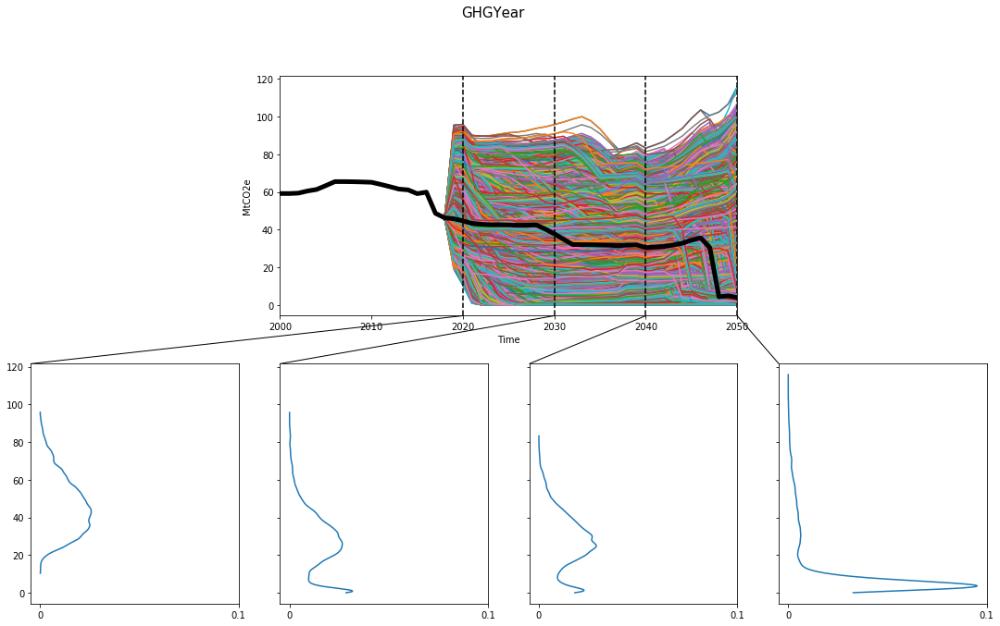

In [104]:
from EMAworkbench.ema_workbench.analysis.plotting import multiple_densities, PlotType
from EMAworkbench.ema_workbench.analysis.plotting_util import Density 

fig, ax_env = multiple_densities(experiments, outcomes_filtered, outcomes_to_show = ooi,
                                 points_in_time=points_of_interest, density = Density.KDE, grouping_specifiers=None, 
                                 titles={ooi}, ylabels={ooi: "MtCO2e"}, legend=True,
                                 fill=False, plot_type=PlotType.ENV_LIN)

#Change x labels to years
ax_env[ooi]['main plot'].set_xticklabels(time[range(0,len(time),10)])

#Add BAU in the plot with a gray wide line
ax_env[ooi]['main plot'].plot(outcomes_filtered[ooi][-1], 'k-',linewidth=5 )

## Show labels
# labels = ax_env['F']['main plot'].get_xticklabels()
# for l in labels:
#     print (l.get_text)

fig[0].suptitle("{}".format(ooi), fontsize=15)
fig[0].set_size_inches(18.5, 10.5)

plt.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', 'envelope_line_density_%s'%(ooi)),
                dpi=300, bbox_inches='tight')
    

Densities (PDF): {'18.1 to 25.9': '0.007', '25.9 to 33.7': '0.021', '33.7 to 41.5': '0.025', '41.5 to 49.2': '0.025', '49.2 to 57.0': '0.021', '57.0 to 64.8': '0.013', '64.8 to 72.5': '0.009', '72.5 to 80.3': '0.005', '80.3 to 88.1': '0.002'}
% in Bin: {'10.4 to 18.1': '0.3%', '18.1 to 25.9': '5.8%', '25.9 to 33.7': '16.1%', '33.7 to 41.5': '19.5%', '41.5 to 49.2': '19.7%', '49.2 to 57.0': '16.2%', '57.0 to 64.8': '10.5%', '64.8 to 72.5': '6.6%', '72.5 to 80.3': '3.8%', '80.3 to 88.1': '1.4%', '88.1 to 95.8': '0.3%'}

Densities (PDF): {'0.1 to 8.8': '0.022', '8.8 to 17.5': '0.013', '17.5 to 26.2': '0.025', '26.2 to 34.8': '0.025', '34.8 to 43.5': '0.017', '43.5 to 52.2': '0.008', '52.2 to 60.9': '0.003', '60.9 to 69.6': '0.002'}
% in Bin: {'0.1 to 8.8': '19.5%', '8.8 to 17.5': '10.9%', '17.5 to 26.2': '21.4%', '26.2 to 34.8': '21.9%', '34.8 to 43.5': '14.5%', '43.5 to 52.2': '6.8%', '52.2 to 60.9': '2.9%', '60.9 to 69.6': '1.3%', '69.6 to 78.3': '0.5%', '78.3 to 87.0': '0.3%', '87.0 to

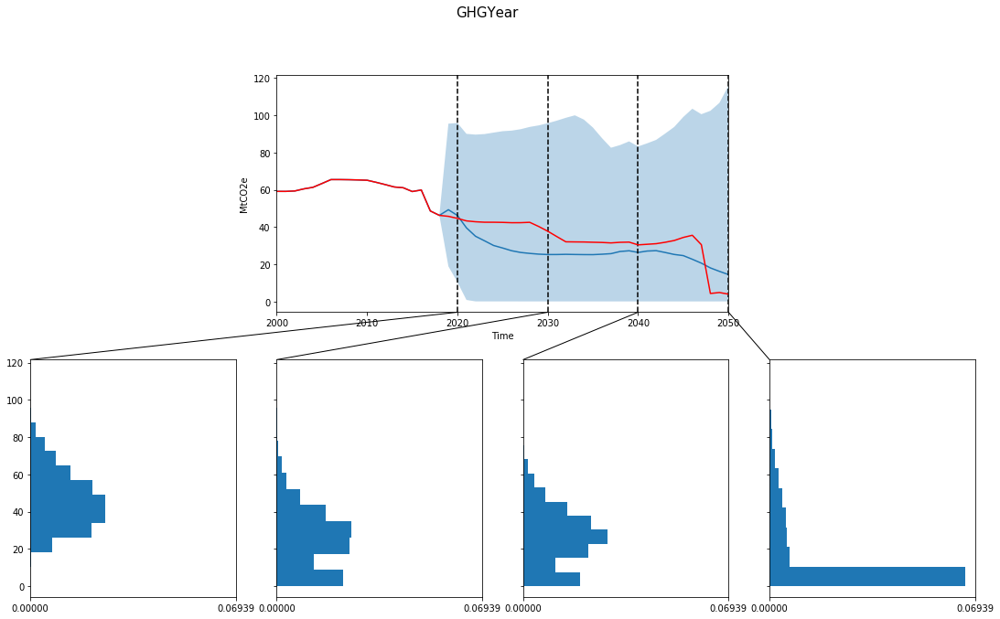

In [18]:
from EMAworkbench.ema_workbench.analysis.plotting import multiple_densities, PlotType
from EMAworkbench.ema_workbench.analysis.plotting_util import Density 

fig, ax_env = multiple_densities(experiments, outcomes_filtered, outcomes_to_show = ooi,
                                 points_in_time=points_of_interest, density = Density.HIST, grouping_specifiers=None,
                                 titles={ooi}, ylabels={ooi: "MtCO2e"}, legend=True,
                                 fill=True, plot_type=PlotType.ENVELOPE)

#Change x labels to years
ax_env[ooi]['main plot'].set_xticklabels(time[range(0,len(time),10)])

#Add BAU in the plot with a gray red line
ax_env[ooi]['main plot'].plot(outcomes_filtered[ooi][-1], 'r-')

## Show labels
# labels = ax_env['F']['main plot'].get_xticklabels()
# for l in labels:
#     print (l.get_text)

fig[0].suptitle("{}".format(ooi), fontsize=15)
fig[0].set_size_inches(18.5, 10.5)
#plt.legend()

plt.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', '_envelope_density_%s'%(ooi)),
                dpi=300, bbox_inches='tight')


### PrimarySpot Wholesale Price

In [19]:
# Subset Sobol levers
#selected_levers = list(['rooftopPV','annualCpi', 'generationRolloutPeriod', 'generatorRetirement','capacityFactorChangeBrownCoal','semiScheduleMinCapMarketGen'])    

select_uncertainties = uncertainties
ooi = 'PrimarySpot-WholesalePriceYear'
data = outcomes_filtered[ooi]

num_exp = len(data)
out_avg_ooi = np.zeros(num_exp)

for i in range(num_exp):
    out_avg_ooi[i] = data[i].mean()

exp = pd.DataFrame(experiments)

exp = exp.loc[ :, select_uncertainties] 

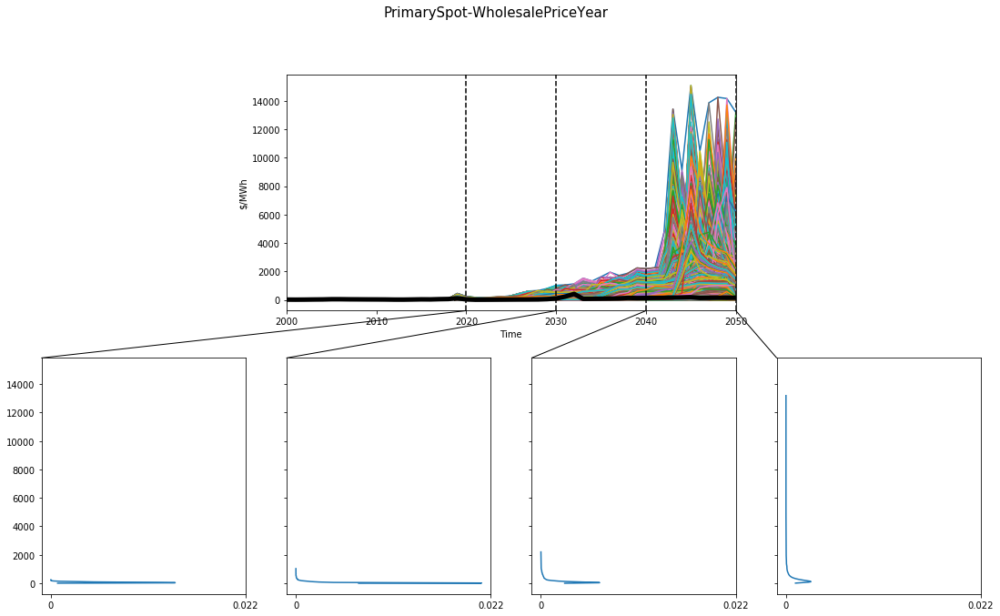

In [20]:
from EMAworkbench.ema_workbench.analysis.plotting import multiple_densities, PlotType
from EMAworkbench.ema_workbench.analysis.plotting_util import Density 

# fig, ax_env = multiple_densities(experiments, outcomes_filtered, outcomes_to_show = ooi,
#                                  points_in_time=points_of_interest,  density = Density.KDE,
#                                  grouping_specifiers=None , titles={ooi}, ylabels={ooi: "$/MWh"}, legend=True,
#                                  fill=False, plot_type=PlotType.ENV_LIN)

fig, ax_env = multiple_densities(experiments, outcomes_filtered, outcomes_to_show = ooi,
                                 points_in_time=points_of_interest,  density = Density.KDE,
                                 grouping_specifiers=None , titles={ooi}, ylabels={ooi: "$/MWh"}, legend=True,
                                 fill=False, plot_type=PlotType.ENV_LIN)
#Change x labels to years
ax_env[ooi]['main plot'].set_xticklabels(time[range(0,len(time),10)])
#Add BAU in the plot with a black wide line
ax_env[ooi]['main plot'].plot(outcomes_filtered[ooi][-1], 'k-',linewidth=5 )

fig[0].suptitle("{}".format(ooi), fontsize=15)
fig[0].set_size_inches(18.5, 10.5)

plt.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', '_envelope_line_density_%s'%(ooi)),
                dpi=300, bbox_inches='tight')

Densities (PDF): {'5.7 to 27.2': '0.007', '27.2 to 48.7': '0.014', '48.7 to 70.2': '0.012', '70.2 to 91.7': '0.007', '91.7 to 113.2': '0.004', '113.2 to 134.8': '0.002'}
% in Bin: {'5.7 to 27.2': '15.9%', '27.2 to 48.7': '29.6%', '48.7 to 70.2': '24.9%', '70.2 to 91.7': '16.0%', '91.7 to 113.2': '8.0%', '113.2 to 134.8': '3.4%', '134.8 to 156.3': '1.7%', '156.3 to 177.8': '0.4%', '177.8 to 199.3': '0.1%', '199.3 to 220.8': '0.0%', '220.8 to 242.3': '0.0%'}

Densities (PDF): {'0.0 to 93.5': '0.009', '93.5 to 187.1': '0.001'}
% in Bin: {'0.0 to 93.5': '82.6%', '93.5 to 187.1': '12.7%', '187.1 to 280.6': '2.9%', '280.6 to 374.2': '1.1%', '374.2 to 467.7': '0.5%', '467.7 to 561.3': '0.2%', '561.3 to 654.8': '0.0%', '654.8 to 748.4': '0.0%', '748.4 to 841.9': '0.0%', '841.9 to 935.5': '0.0%', '935.5 to 1029.0': '0.0%'}

Densities (PDF): {'0.0 to 200.2': '0.004'}
% in Bin: {'0.0 to 200.2': '78.9%', '200.2 to 400.3': '10.6%', '400.3 to 600.5': '5.3%', '600.5 to 800.6': '2.8%', '800.6 to 1000.

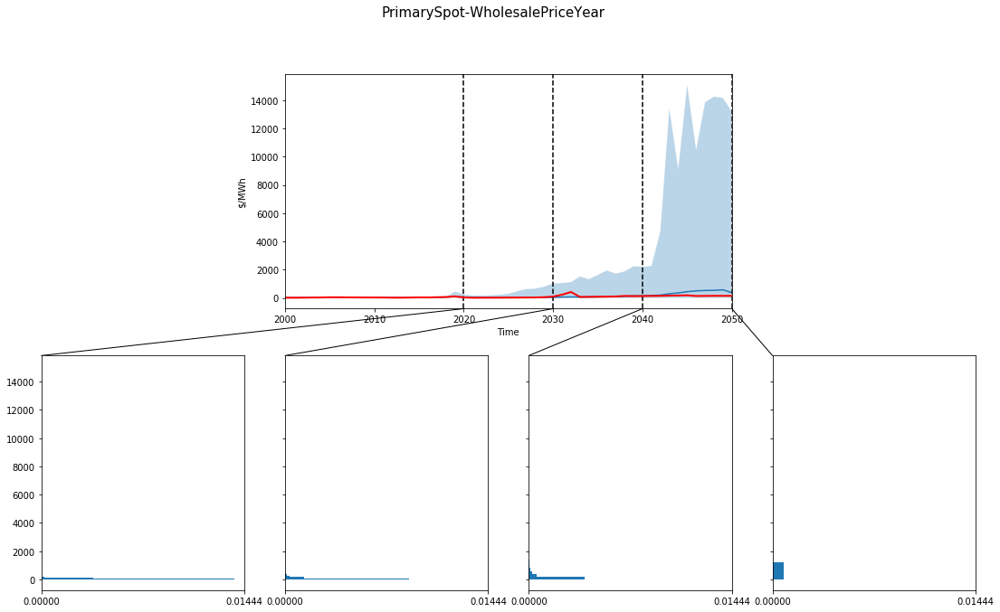

In [24]:
from EMAworkbench.ema_workbench.analysis.plotting import multiple_densities, PlotType
from EMAworkbench.ema_workbench.analysis.plotting_util import Density

# fig, ax_env = multiple_densities(experiments, outcomes_filtered, outcomes_to_show = ooi,
#                                  points_in_time=points_of_interest,  density = Density.HIST,
#                                  grouping_specifiers=None , titles={ooi}, ylabels={ooi: "$/MWh"}, legend=True,
#                                  fill=True, plot_type=PlotType.ENVELOPE)

fig, ax_env = multiple_densities(experiments, outcomes_filtered, outcomes_to_show = ooi,
                                 points_in_time=points_of_interest,  density = Density.HIST,
                                 grouping_specifiers=None , titles={ooi}, ylabels={ooi: "$/MWh"}, legend=True,
                                 fill=True, plot_type=PlotType.ENVELOPE)

#Change x labels to years
ax_env[ooi]['main plot'].set_xticklabels(time[range(0,len(time),10)])
#Add BAU in the plot with a red wide line
ax_env[ooi]['main plot'].plot(outcomes_filtered[ooi][-1], 'r-',linewidth=2 )

fig[0].suptitle("{}".format(ooi), fontsize=15)
fig[0].set_size_inches(18.5, 10.5)

plt.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', '_future_envelope_density_%s'%(ooi)),
                dpi=300, bbox_inches='tight')



### Tariffs

In [25]:
# Subset Sool levers/uncertainties
selected_uncertainties = uncertainties

#selected_levers = levers
ooi = 'tariffsYear'
data = outcomes_filtered[ooi]

num_exp = len(data)
out_avg_ooi = np.zeros(num_exp)

for i in range(num_exp):
    out_avg_ooi[i] = data[i].mean()

exp = pd.DataFrame(experiments)

exp = exp.loc[ :, selected_uncertainties] 

: 20-25% by 2025 on 2017. tariffs in 2017: ~21 c/KWh

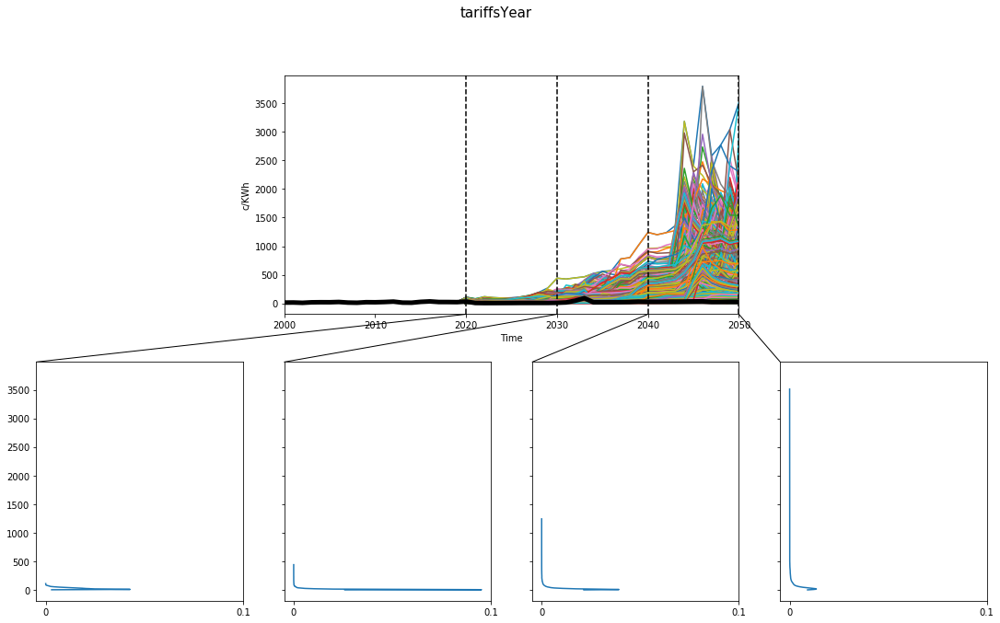

In [26]:
from EMAworkbench.ema_workbench.analysis.plotting import multiple_densities, PlotType
from EMAworkbench.ema_workbench.analysis.plotting_util import Density

fig, ax_env = multiple_densities(experiments, outcomes_filtered, outcomes_to_show = ooi,
                                 points_in_time=points_of_interest,  density = Density.KDE,
                                 grouping_specifiers=None , titles={ooi}, ylabels={ooi: "c/KWh"}, legend=True,
                                 fill=False, plot_type=PlotType.ENV_LIN)

#Change x labels to years
ax_env[ooi]['main plot'].set_xticklabels(time[range(0,len(time),10)])
#Add BAU in the plot with a black wide line
ax_env[ooi]['main plot'].plot(outcomes_filtered[ooi][-1], 'k-',linewidth=5 )


fig[0].suptitle("{}".format(ooi), fontsize=15)
fig[0].set_size_inches(18.5, 10.5)

plt.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', '_future_envelope_line_density_%s'%(ooi)),
                dpi=300, bbox_inches='tight')

Densities (PDF): {'2.8 to 12.5': '0.030', '12.5 to 22.3': '0.025', '22.3 to 32.0': '0.019', '32.0 to 41.7': '0.014', '41.7 to 51.4': '0.008', '51.4 to 61.1': '0.004', '61.1 to 70.9': '0.002', '70.9 to 80.6': '0.001'}
% in Bin: {'2.8 to 12.5': '29.2%', '12.5 to 22.3': '24.0%', '22.3 to 32.0': '18.9%', '32.0 to 41.7': '13.4%', '41.7 to 51.4': '7.8%', '51.4 to 61.1': '3.7%', '61.1 to 70.9': '2.0%', '70.9 to 80.6': '0.9%', '80.6 to 90.3': '0.2%', '90.3 to 100.0': '0.1%', '100.0 to 109.8': '0.0%'}

Densities (PDF): {'0.8 to 40.8': '0.024'}
% in Bin: {'0.8 to 40.8': '96.0%', '40.8 to 80.8': '3.1%', '80.8 to 120.9': '0.5%', '120.9 to 160.9': '0.2%', '160.9 to 200.9': '0.1%', '200.9 to 241.0': '0.1%', '241.0 to 281.0': '0.0%', '281.0 to 321.1': '0.0%', '321.1 to 361.1': '0.0%', '361.1 to 401.1': '0.0%', '401.1 to 441.2': '0.0%'}

Densities (PDF): {'0.6 to 113.4': '0.008'}
% in Bin: {'0.6 to 113.4': '95.8%', '113.4 to 226.2': '3.1%', '226.2 to 339.1': '0.8%', '339.1 to 451.9': '0.2%', '451.9 to

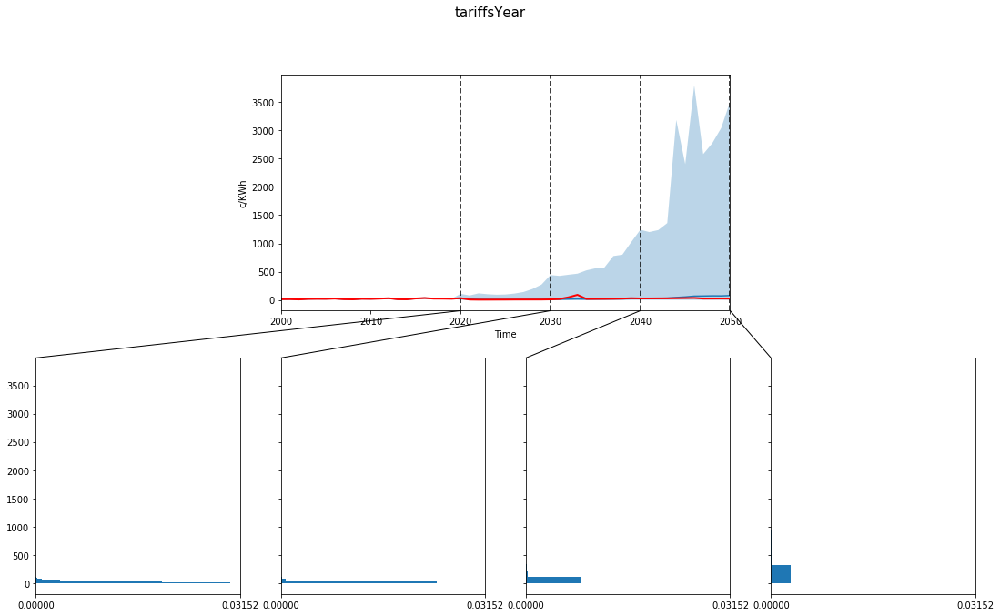

In [28]:
from EMAworkbench.ema_workbench.analysis.plotting import multiple_densities, PlotType
from EMAworkbench.ema_workbench.analysis.plotting_util import Density

fig, ax_env = multiple_densities(experiments, outcomes_filtered, outcomes_to_show = ooi,
                                 points_in_time=points_of_interest,  density = Density.HIST,
                                 grouping_specifiers=None , titles={ooi}, ylabels={ooi: "c/KWh"}, legend=True,
                                 fill=True, plot_type=PlotType.ENVELOPE)

#Change x labels to years
ax_env[ooi]['main plot'].set_xticklabels(time[range(0,len(time),10)])
#Add BAU in the plot with a red wide line
ax_env[ooi]['main plot'].plot(outcomes_filtered[ooi][-1], 'r-',linewidth=2 )


fig[0].suptitle("{}".format(ooi), fontsize=15)
fig[0].set_size_inches(18.5, 10.5)

plt.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', '_future_envelope_density_%s'%(ooi)),
                dpi=300, bbox_inches='tight')


### Renewable Energies in the System

In [29]:
# Subset Sool levers/uncertainties

selected_uncertainties = uncertainties

ooi = 'renewableContributionYear'
data = outcomes_filtered[ooi]

num_exp = len(data)
out_avg_ooi = np.zeros(num_exp)

for i in range(num_exp):
    out_avg_ooi[i] = data[i].mean()

exp = pd.DataFrame(experiments)

exp = exp.loc[ :, selected_uncertainties] 

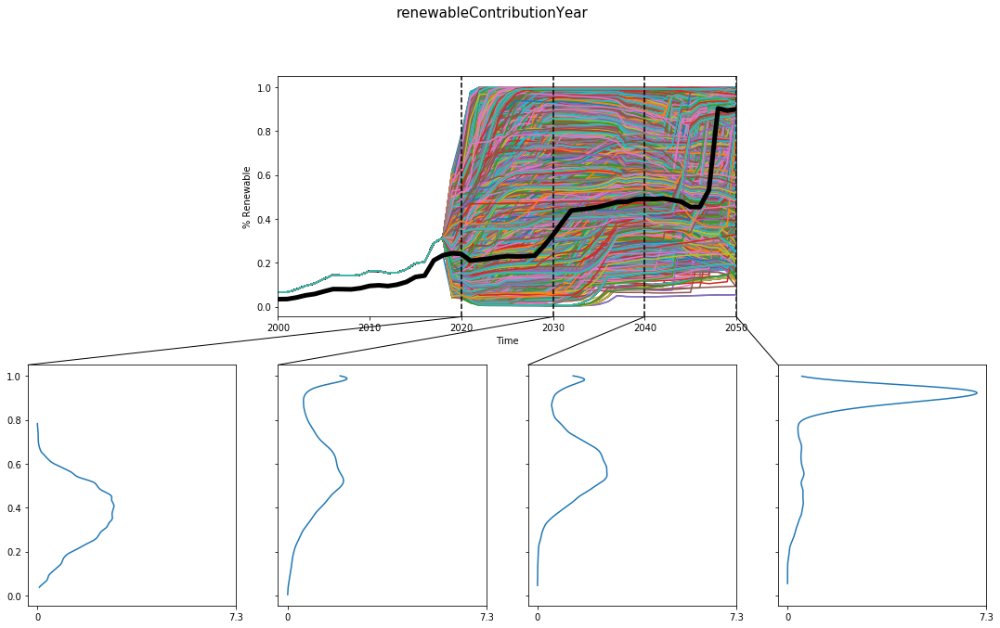

In [30]:
from EMAworkbench.ema_workbench.analysis.plotting import multiple_densities, PlotType
from EMAworkbench.ema_workbench.analysis.plotting_util import Density

fig, ax_env = multiple_densities(experiments, outcomes_filtered, outcomes_to_show = ooi,
                                 points_in_time=points_of_interest,  density = Density.KDE,
                                 grouping_specifiers=None , titles={ooi}, ylabels={ooi: "% Renewable"}, legend=True,
                                 fill=False, plot_type=PlotType.ENV_LIN)

#Change x labels to years
ax_env[ooi]['main plot'].set_xticklabels(time[range(0,len(time),10)])
#Add BAU in the plot with a black wide line
ax_env[ooi]['main plot'].plot(outcomes_filtered[ooi][-1], 'k-',linewidth=5 )

fig[0].suptitle("{}".format(ooi), fontsize=15)
fig[0].set_size_inches(18.5, 10.5)

plt.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', '_future_envelope_line_density_%s'%(ooi)),
                dpi=300, bbox_inches='tight')

Densities (PDF): {'0.0 to 0.1': '0.316', '0.1 to 0.2': '0.804', '0.2 to 0.2': '1.397', '0.2 to 0.3': '2.254', '0.3 to 0.4': '2.715', '0.4 to 0.4': '2.762', '0.4 to 0.5': '2.448', '0.5 to 0.6': '1.488', '0.6 to 0.6': '0.495', '0.6 to 0.7': '0.065', '0.7 to 0.8': '0.020'}
% in Bin: {'0.0 to 0.1': '2.1%', '0.1 to 0.2': '5.4%', '0.2 to 0.2': '9.5%', '0.2 to 0.3': '15.3%', '0.3 to 0.4': '18.4%', '0.4 to 0.4': '18.7%', '0.4 to 0.5': '16.6%', '0.5 to 0.6': '10.1%', '0.6 to 0.6': '3.4%', '0.6 to 0.7': '0.4%', '0.7 to 0.8': '0.1%'}

Densities (PDF): {'0.0 to 0.1': '0.043', '0.1 to 0.2': '0.148', '0.2 to 0.3': '0.335', '0.3 to 0.4': '0.714', '0.4 to 0.5': '1.297', '0.5 to 0.5': '1.980', '0.5 to 0.6': '1.840', '0.6 to 0.7': '1.424', '0.7 to 0.8': '0.856', '0.8 to 0.9': '0.598', '0.9 to 1.0': '1.813'}
% in Bin: {'0.0 to 0.1': '0.4%', '0.1 to 0.2': '1.3%', '0.2 to 0.3': '3.0%', '0.3 to 0.4': '6.5%', '0.4 to 0.5': '11.7%', '0.5 to 0.5': '17.9%', '0.5 to 0.6': '16.7%', '0.6 to 0.7': '12.9%', '0.7 to 

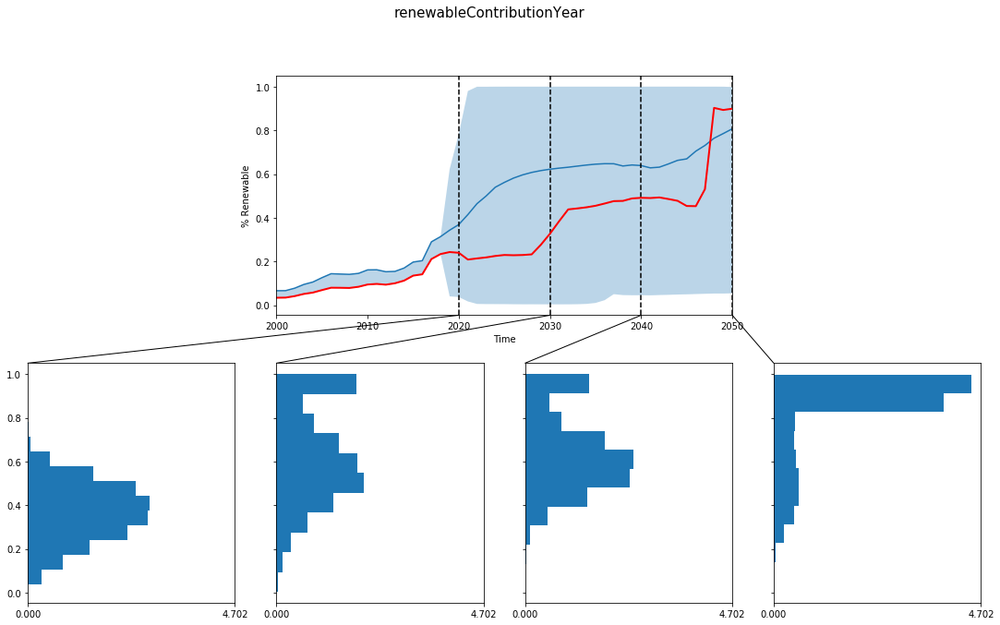

In [31]:
from EMAworkbench.ema_workbench.analysis.plotting import multiple_densities, PlotType
from EMAworkbench.ema_workbench.analysis.plotting_util import Density

fig, ax_env = multiple_densities(experiments, outcomes_filtered, outcomes_to_show = ooi,
                                 points_in_time=points_of_interest,  density = Density.HIST,
                                 grouping_specifiers=None , titles={ooi}, ylabels={ooi: "% Renewable"}, legend=True,
                                 fill=True, plot_type=PlotType.ENVELOPE)

#Change x labels to years
ax_env[ooi]['main plot'].set_xticklabels(time[range(0,len(time),10)])
#Add BAU in the plot with a red wide line
ax_env[ooi]['main plot'].plot(outcomes_filtered[ooi][-1], 'r-',linewidth=2 )

fig[0].suptitle("{}".format(ooi), fontsize=15)
fig[0].set_size_inches(18.5, 10.5)

plt.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', '_future_envelope_density_%s'%(ooi)),
                dpi=300, bbox_inches='tight')

### Percentage  Primary Unmet Consumption

In [127]:
# Subset Sool levers
selected_uncertainties = uncertainties

ooi = 'unmetPercentageConsumptionPrimary'
data = outcomes_filtered[ooi]

num_exp = len(data)
out_avg_ooi = np.zeros(num_exp)

for i in range(num_exp):
    out_avg_ooi[i] = data[i].mean()

exp = pd.DataFrame(experiments)

exp = exp.loc[ :, selected_uncertainties] 

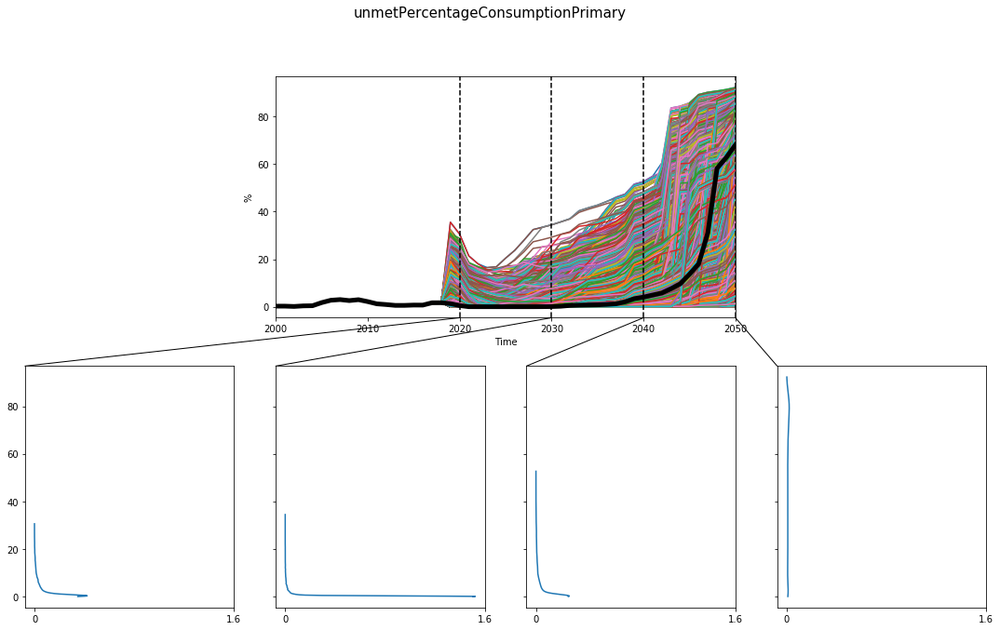

In [129]:
from EMAworkbench.ema_workbench.analysis.plotting import multiple_densities, PlotType
from EMAworkbench.ema_workbench.analysis.plotting_util import Density

fig, ax_env = multiple_densities(experiments, outcomes_filtered, outcomes_to_show = ooi,
                                 points_in_time=points_of_interest,  density = Density.KDE,
                                 grouping_specifiers=None , titles={ooi}, ylabels={ooi: "%"}, legend=True,
                                 fill=False, plot_type=PlotType.ENV_LIN)

#Change x labels to years
ax_env[ooi]['main plot'].set_xticklabels(time[range(0,len(time),10)])
#Add BAU in the plot with a black wide line
ax_env[ooi]['main plot'].plot(outcomes_filtered[ooi][-1], 'k-',linewidth=5 )

fig[0].suptitle("{}".format(ooi), fontsize=15)
fig[0].set_size_inches(18.5, 10.5)

plt.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', '_future_envelope_line_density_%s'%(ooi)),
                dpi=300, bbox_inches='tight')

Densities (PDF): {'0.0 to 2.8': '0.246', '2.8 to 5.6': '0.048', '5.6 to 8.3': '0.027', '8.3 to 11.1': '0.016', '11.1 to 13.9': '0.011', '13.9 to 16.7': '0.007', '16.7 to 19.5': '0.003', '19.5 to 22.2': '0.001'}
% in Bin: {'0.0 to 2.8': '68.3%', '2.8 to 5.6': '13.4%', '5.6 to 8.3': '7.6%', '8.3 to 11.1': '4.4%', '11.1 to 13.9': '3.0%', '13.9 to 16.7': '1.8%', '16.7 to 19.5': '0.9%', '19.5 to 22.2': '0.4%', '22.2 to 25.0': '0.2%', '25.0 to 27.8': '0.0%', '27.8 to 30.6': '0.0%'}

Densities (PDF): {'0.0 to 3.1': '0.298', '3.1 to 6.3': '0.012', '6.3 to 9.4': '0.005', '9.4 to 12.5': '0.002', '12.5 to 15.7': '0.001'}
% in Bin: {'0.0 to 3.1': '93.3%', '3.1 to 6.3': '3.9%', '6.3 to 9.4': '1.6%', '9.4 to 12.5': '0.6%', '12.5 to 15.7': '0.3%', '15.7 to 18.8': '0.2%', '18.8 to 21.9': '0.1%', '21.9 to 25.1': '0.0%', '25.1 to 28.2': '0.0%', '28.2 to 31.3': '0.0%', '31.3 to 34.5': '0.0%'}

Densities (PDF): {'0.0 to 4.8': '0.148', '4.8 to 9.6': '0.025', '9.6 to 14.4': '0.013', '14.4 to 19.2': '0.008',

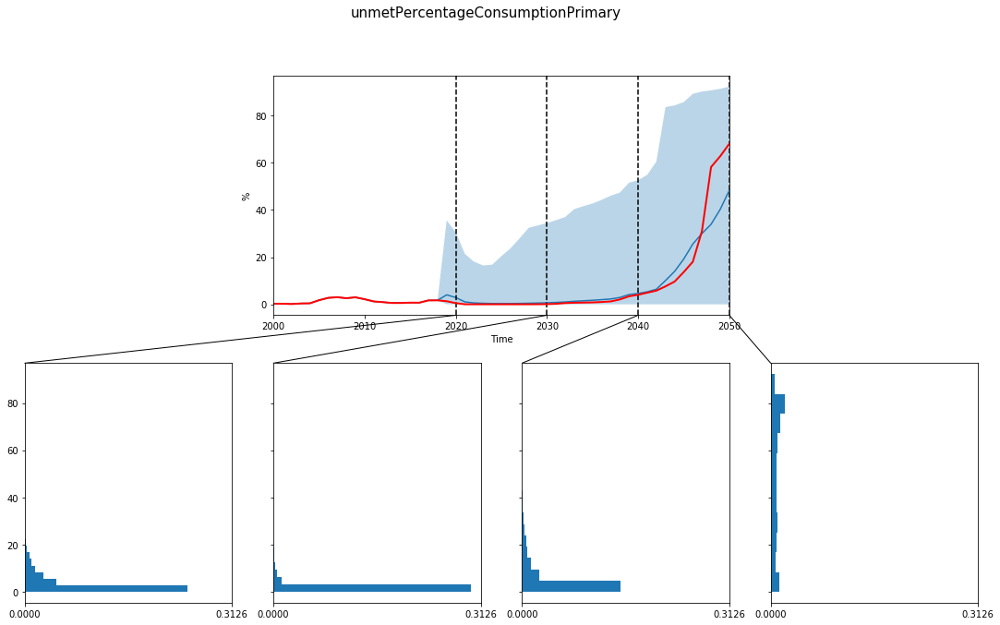

In [128]:
from EMAworkbench.ema_workbench.analysis.plotting import multiple_densities, PlotType
from EMAworkbench.ema_workbench.analysis.plotting_util import Density

fig, ax_env = multiple_densities(experiments, outcomes_filtered, outcomes_to_show = ooi,
                                 points_in_time=points_of_interest,  density = Density.HIST,
                                 grouping_specifiers=None , titles={ooi}, ylabels={ooi: "%"}, legend=True,
                                 fill=True, plot_type=PlotType.ENVELOPE)

#Change x labels to years
ax_env[ooi]['main plot'].set_xticklabels(time[range(0,len(time),10)])
#Add BAU in the plot with a red wide line
ax_env[ooi]['main plot'].plot(outcomes_filtered[ooi][-1], 'r-',linewidth=2 )

fig[0].suptitle("{}".format(ooi), fontsize=15)
fig[0].set_size_inches(18.5, 10.5)

plt.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', '_future_envelope_density_%s'%(ooi)),
                dpi=300, bbox_inches='tight')

### Percentage  Secondary Unmet Consumption

In [130]:
# Subset Sool levers
selected_uncertainties = uncertainties

ooi = 'unmetPercentageConsumptionSecondary'
data = outcomes_filtered[ooi]

num_exp = len(data)
out_avg_ooi = np.zeros(num_exp)

for i in range(num_exp):
    out_avg_ooi[i] = data[i].mean()

exp = pd.DataFrame(experiments)

exp = exp.loc[ :, selected_uncertainties] 

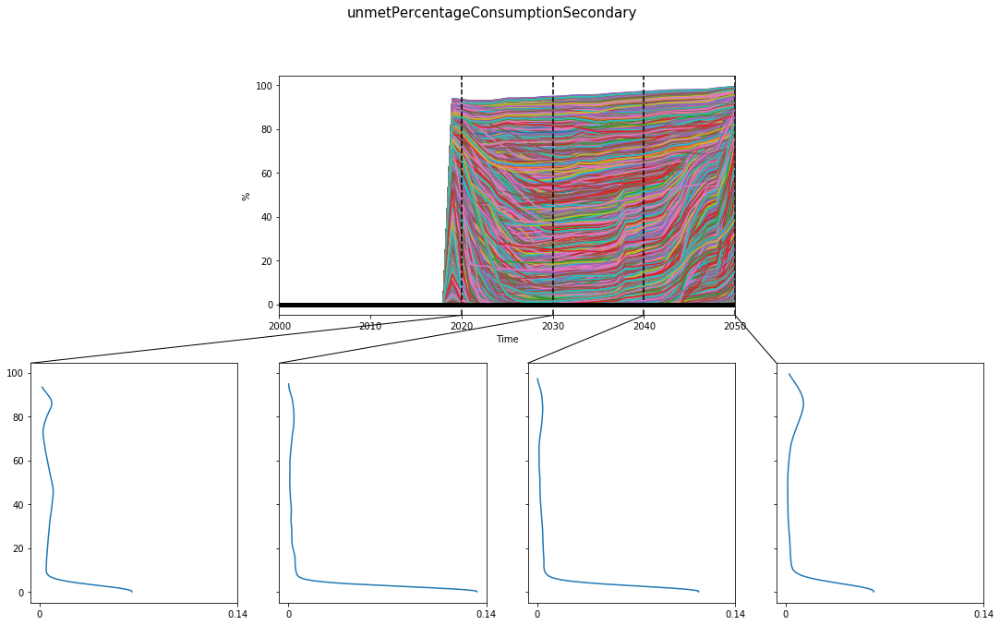

In [132]:
from EMAworkbench.ema_workbench.analysis.plotting import multiple_densities, PlotType
from EMAworkbench.ema_workbench.analysis.plotting_util import Density

fig, ax_env = multiple_densities(experiments, outcomes_filtered, outcomes_to_show = ooi,
                                 points_in_time=points_of_interest,  density = Density.KDE,
                                 grouping_specifiers=None , titles={ooi}, ylabels={ooi: "%"}, legend=True,
                                 fill=False, plot_type=PlotType.ENV_LIN)

#Change x labels to years
ax_env[ooi]['main plot'].set_xticklabels(time[range(0,len(time),10)])
#Add BAU in the plot with a black wide line
ax_env[ooi]['main plot'].plot(outcomes_filtered[ooi][-1], 'k-',linewidth=5 )

fig[0].suptitle("{}".format(ooi), fontsize=15)
fig[0].set_size_inches(18.5, 10.5)

plt.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', '_future_envelope_line_density_%s'%(ooi)),
                dpi=300, bbox_inches='tight')

Densities (PDF): {'0.0 to 8.5': '0.057', '8.5 to 17.0': '0.005', '17.0 to 25.5': '0.006', '25.5 to 34.0': '0.007', '34.0 to 42.4': '0.009', '42.4 to 50.9': '0.009', '50.9 to 59.4': '0.007', '59.4 to 67.9': '0.004', '67.9 to 76.4': '0.002', '76.4 to 84.9': '0.005', '84.9 to 93.4': '0.007'}
% in Bin: {'0.0 to 8.5': '48.3%', '8.5 to 17.0': '4.1%', '17.0 to 25.5': '4.8%', '25.5 to 34.0': '5.6%', '34.0 to 42.4': '7.3%', '42.4 to 50.9': '7.9%', '50.9 to 59.4': '5.9%', '59.4 to 67.9': '3.7%', '67.9 to 76.4': '1.9%', '76.4 to 84.9': '4.7%', '84.9 to 93.4': '5.8%'}

Densities (PDF): {'0.0 to 8.6': '0.092', '8.6 to 17.2': '0.005', '17.2 to 25.9': '0.003', '25.9 to 34.5': '0.002', '34.5 to 43.1': '0.002', '43.1 to 51.7': '0.001', '51.7 to 60.3': '0.001', '60.3 to 68.9': '0.002', '68.9 to 77.6': '0.003', '77.6 to 86.2': '0.004', '86.2 to 94.8': '0.002'}
% in Bin: {'0.0 to 8.6': '78.9%', '8.6 to 17.2': '4.3%', '17.2 to 25.9': '2.4%', '25.9 to 34.5': '1.8%', '34.5 to 43.1': '1.8%', '43.1 to 51.7': '

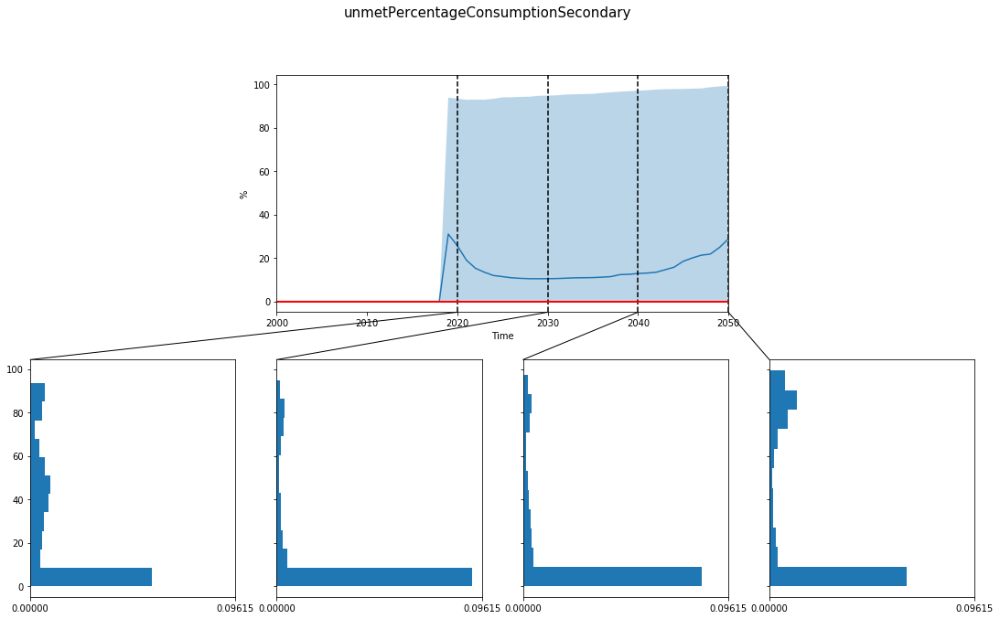

In [131]:
from EMAworkbench.ema_workbench.analysis.plotting import multiple_densities, PlotType
from EMAworkbench.ema_workbench.analysis.plotting_util import Density

fig, ax_env = multiple_densities(experiments, outcomes_filtered, outcomes_to_show = ooi,
                                 points_in_time=points_of_interest,  density = Density.HIST,
                                 grouping_specifiers=None , titles={ooi}, ylabels={ooi: "%"}, legend=True,
                                 fill=True, plot_type=PlotType.ENVELOPE)

#Change x labels to years
ax_env[ooi]['main plot'].set_xticklabels(time[range(0,len(time),10)])
#Add BAU in the plot with a red wide line
ax_env[ooi]['main plot'].plot(outcomes_filtered[ooi][-1], 'r-',linewidth=2 )

fig[0].suptitle("{}".format(ooi), fontsize=15)
fig[0].set_size_inches(18.5, 10.5)

plt.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', '_future_envelope_density_%s'%(ooi)),
                dpi=300, bbox_inches='tight')

### Unmet Demand - Primary Unmet demand in MWh 

In [32]:
# Subset Sool levers
selected_uncertainties = uncertainties

ooi = 'primaryUnmetDemandMwh'
data = outcomes_filtered[ooi]

num_exp = len(data)
out_avg_ooi = np.zeros(num_exp)

for i in range(num_exp):
    out_avg_ooi[i] = data[i].mean()

exp = pd.DataFrame(experiments)

exp = exp.loc[ :, selected_uncertainties] 

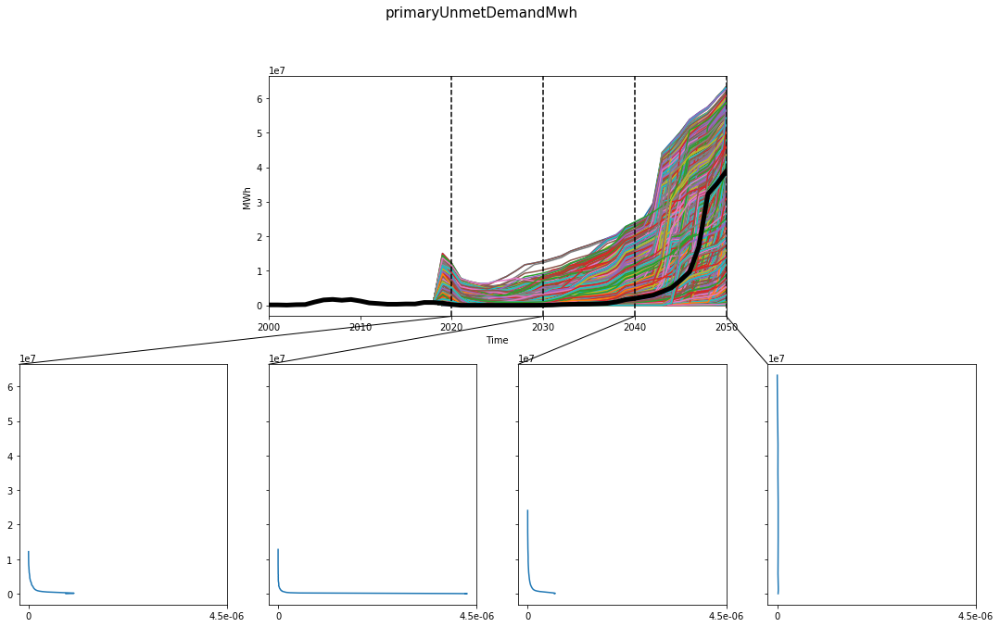

In [33]:
from EMAworkbench.ema_workbench.analysis.plotting import multiple_densities, PlotType
from EMAworkbench.ema_workbench.analysis.plotting_util import Density

fig, ax_env = multiple_densities(experiments, outcomes_filtered, outcomes_to_show = ooi,
                                 points_in_time=points_of_interest,  density = Density.KDE,
                                 grouping_specifiers=None , titles={ooi}, ylabels={ooi: "MWh"}, legend=True,
                                 fill=False, plot_type=PlotType.ENV_LIN)

#Change x labels to years
ax_env[ooi]['main plot'].set_xticklabels(time[range(0,len(time),10)])
#Add BAU in the plot with a black wide line
ax_env[ooi]['main plot'].plot(outcomes_filtered[ooi][-1], 'k-',linewidth=5 )

fig[0].suptitle("{}".format(ooi), fontsize=15)
fig[0].set_size_inches(18.5, 10.5)

plt.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', '_future_envelope_line_density_%s'%(ooi)),
                dpi=300, bbox_inches='tight')

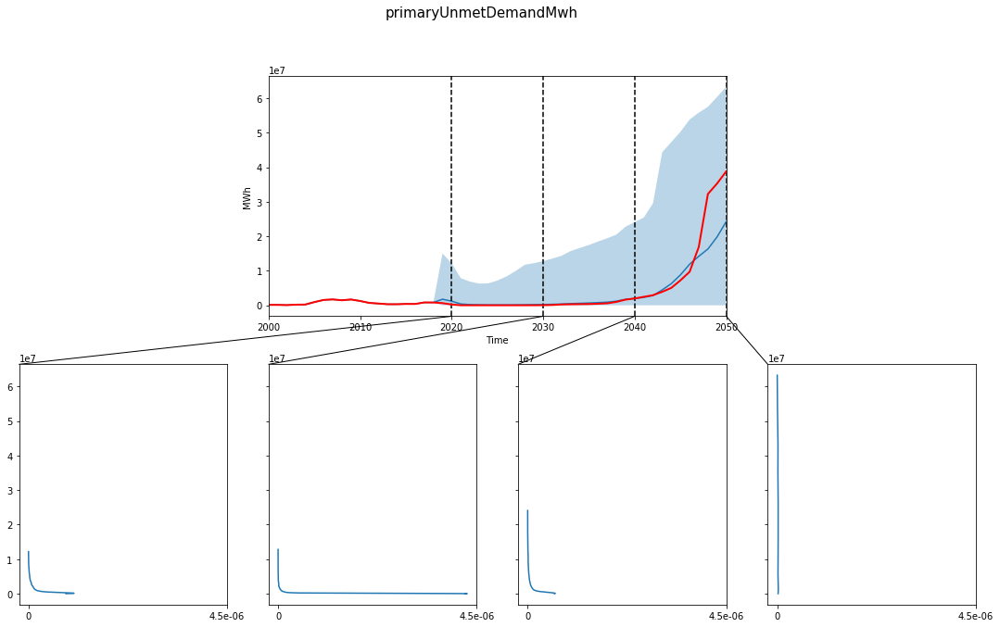

In [34]:
from EMAworkbench.ema_workbench.analysis.plotting import multiple_densities, PlotType
from EMAworkbench.ema_workbench.analysis.plotting_util import Density

fig, ax_env = multiple_densities(experiments, outcomes_filtered, outcomes_to_show = ooi,
                                 points_in_time=points_of_interest,  density = Density.Hist,
                                 grouping_specifiers=None , titles={ooi}, ylabels={ooi: "MWh"}, legend=True,
                                 fill=True, plot_type=PlotType.ENVELOPE)

#Change x labels to years
ax_env[ooi]['main plot'].set_xticklabels(time[range(0,len(time),10)])
#Add BAU in the plot with a red wide line
ax_env[ooi]['main plot'].plot(outcomes_filtered[ooi][-1], 'r-',linewidth=2 )

fig[0].suptitle("{}".format(ooi), fontsize=15)
fig[0].set_size_inches(18.5, 10.5)

plt.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', '_future_envelope_density_%s'%(ooi)),
                dpi=300, bbox_inches='tight')

### Unmet Demand - Primary unmet demand (hours)

In [35]:
# Subset Sool levers
selected_uncertainties = uncertainties

ooi = 'primaryUnmetDemandHours'
data = outcomes_filtered[ooi]

num_exp = len(data)
out_avg_ooi = np.zeros(num_exp)

for i in range(num_exp):
    out_avg_ooi[i] = data[i].mean()

exp = pd.DataFrame(experiments)

exp = exp.loc[ :, selected_uncertainties] 

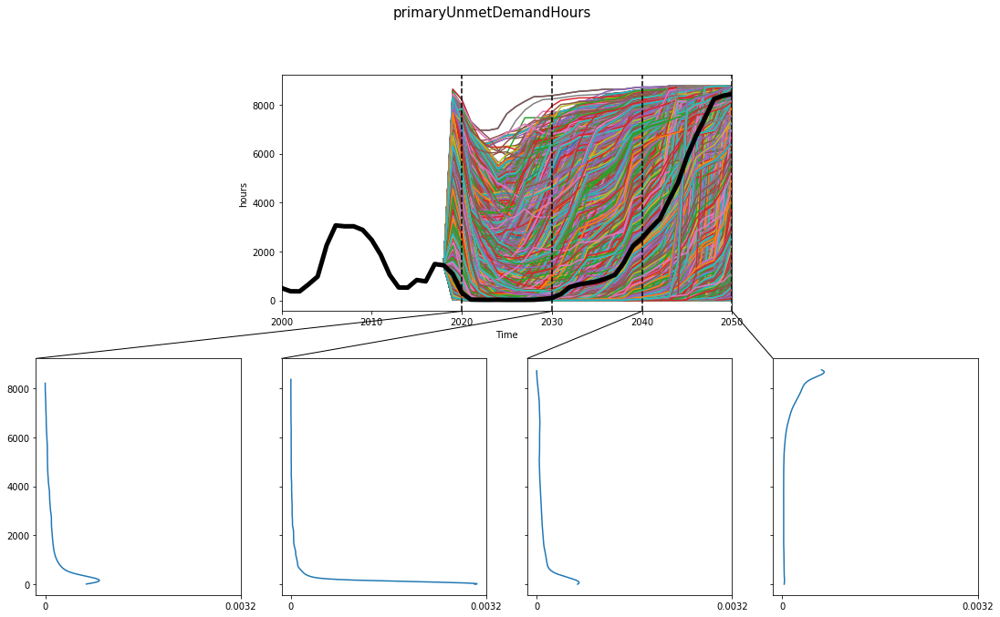

In [36]:
from EMAworkbench.ema_workbench.analysis.plotting import multiple_densities, PlotType
from EMAworkbench.ema_workbench.analysis.plotting_util import Density

fig, ax_env = multiple_densities(experiments, outcomes_filtered, outcomes_to_show = ooi,
                                 points_in_time=points_of_interest,  density = Density.KDE,
                                 grouping_specifiers=None , titles={ooi}, ylabels={ooi: "hours"}, legend=True,
                                 fill=False, plot_type=PlotType.ENV_LIN)

#Change x labels to years
ax_env[ooi]['main plot'].set_xticklabels(time[range(0,len(time),10)])
#Add BAU in the plot with a black wide line
ax_env[ooi]['main plot'].plot(outcomes_filtered[ooi][-1], 'k-',linewidth=5 )

fig[0].suptitle("{}".format(ooi), fontsize=15)
fig[0].set_size_inches(18.5, 10.5)

plt.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', '_future_envelope_line_density_%s'%(ooi)),
                dpi=300, bbox_inches='tight')

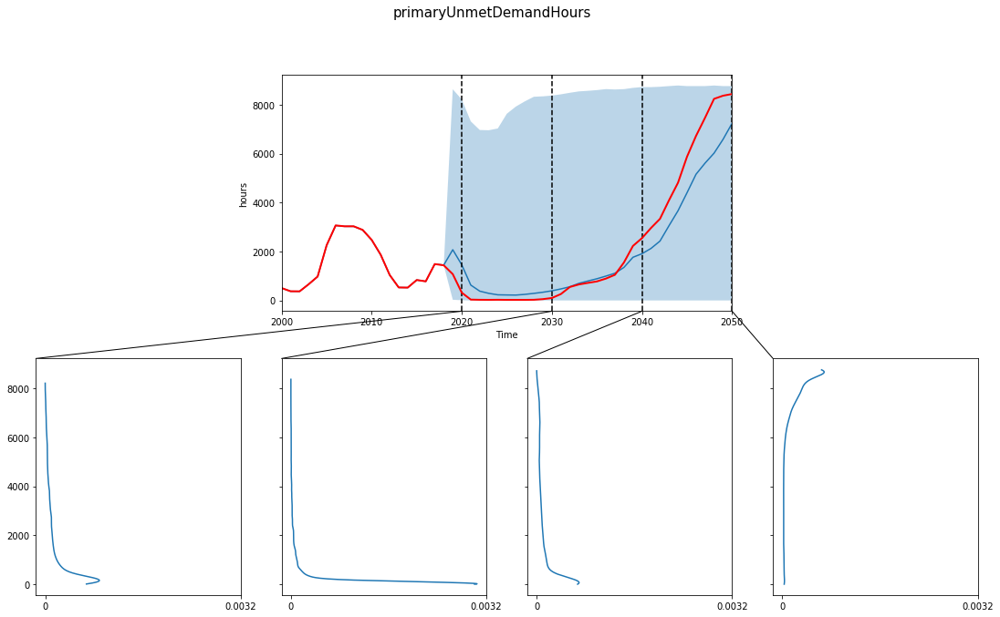

In [37]:
from EMAworkbench.ema_workbench.analysis.plotting import multiple_densities, PlotType
from EMAworkbench.ema_workbench.analysis.plotting_util import Density

fig, ax_env = multiple_densities(experiments, outcomes_filtered, outcomes_to_show = ooi,
                                 points_in_time=points_of_interest,  density = Density.KDE,
                                 grouping_specifiers=None , titles={ooi}, ylabels={ooi: "hours"}, legend=True,
                                 fill=True, plot_type=PlotType.ENVELOPE)

#Change x labels to years
ax_env[ooi]['main plot'].set_xticklabels(time[range(0,len(time),10)])
#Add BAU in the plot with a red wide line
ax_env[ooi]['main plot'].plot(outcomes_filtered[ooi][-1], 'r-',linewidth=2 )

fig[0].suptitle("{}".format(ooi), fontsize=15)
fig[0].set_size_inches(18.5, 10.5)

plt.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', '_future_envelope_density_%s'%(ooi)),
                dpi=300, bbox_inches='tight')

### Unmet Demand - Primary unmet demand (days)

In [38]:
# Subset Sool levers
selected_uncertainties = uncertainties

ooi = 'primaryUnmetDemandDays'
data = outcomes_filtered[ooi]

num_exp = len(data)
out_avg_ooi = np.zeros(num_exp)

for i in range(num_exp):
    out_avg_ooi[i] = data[i].mean()

exp = pd.DataFrame(experiments)

exp = exp.loc[ :, selected_uncertainties] 

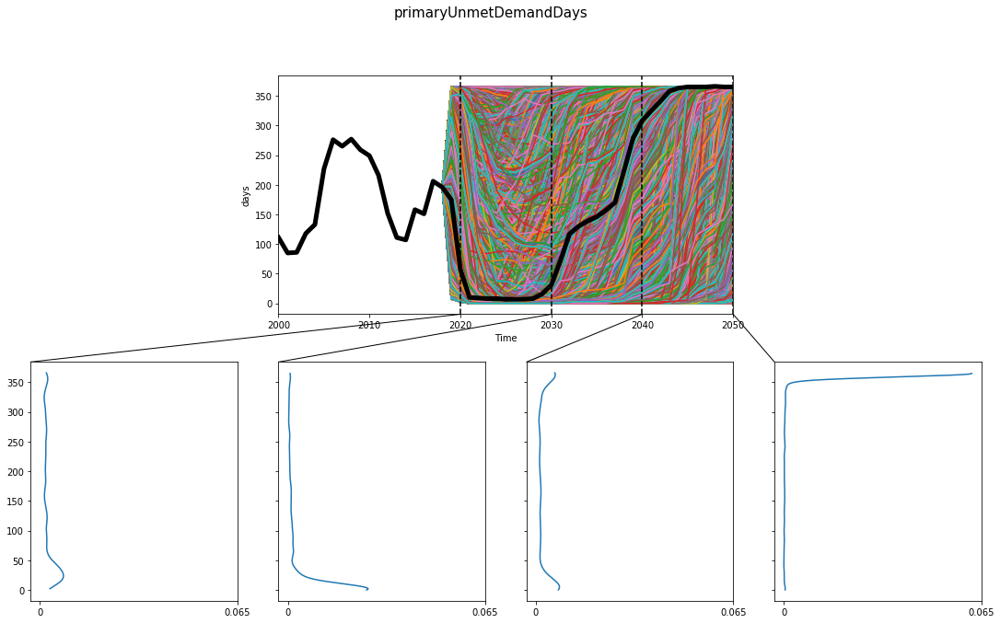

In [39]:
from EMAworkbench.ema_workbench.analysis.plotting import multiple_densities, PlotType
from EMAworkbench.ema_workbench.analysis.plotting_util import Density

fig, ax_env = multiple_densities(experiments, outcomes_filtered, outcomes_to_show = ooi,
                                 points_in_time=points_of_interest,  density = Density.KDE,
                                 grouping_specifiers=None , titles={ooi}, ylabels={ooi: "days"}, legend=True,
                                 fill=False, plot_type=PlotType.ENV_LIN)

#Change x labels to years
ax_env[ooi]['main plot'].set_xticklabels(time[range(0,len(time),10)])
#Add BAU in the plot with a black wide line
ax_env[ooi]['main plot'].plot(outcomes_filtered[ooi][-1], 'k-',linewidth=5 )

fig[0].suptitle("{}".format(ooi), fontsize=15)
fig[0].set_size_inches(18.5, 10.5)

plt.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', '_future_envelope_line_density_%s'%(ooi)),
                dpi=300, bbox_inches='tight')

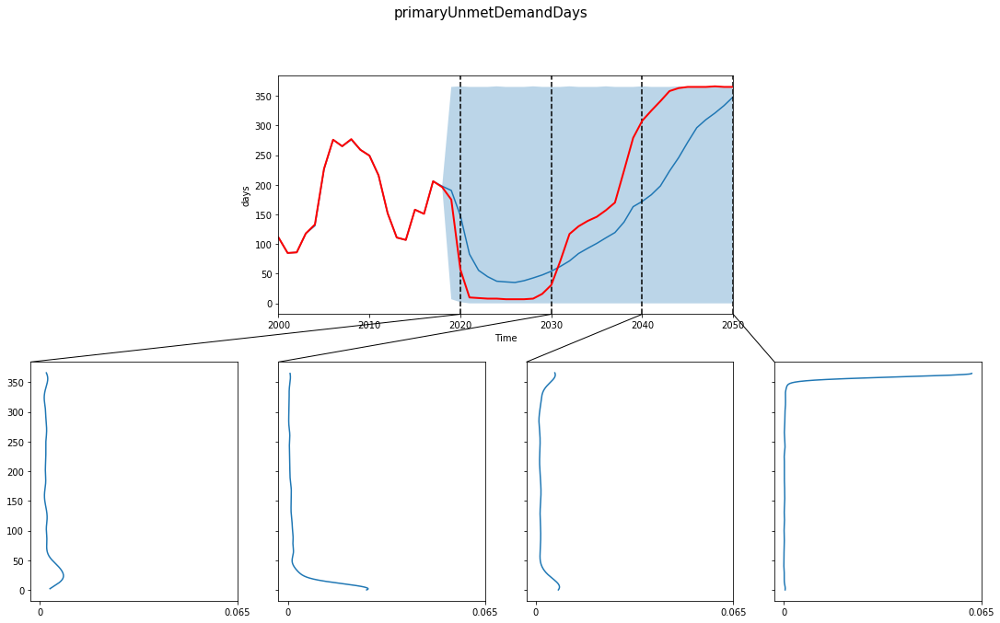

In [40]:
from EMAworkbench.ema_workbench.analysis.plotting import multiple_densities, PlotType
from EMAworkbench.ema_workbench.analysis.plotting_util import Density

fig, ax_env = multiple_densities(experiments, outcomes_filtered, outcomes_to_show = ooi,
                                 points_in_time=points_of_interest,  density = Density.KDE,
                                 grouping_specifiers=None , titles={ooi}, ylabels={ooi: "days"}, legend=True,
                                 fill=True, plot_type=PlotType.ENVELOPE)

#Change x labels to years
ax_env[ooi]['main plot'].set_xticklabels(time[range(0,len(time),10)])
#Add BAU in the plot with a red wide line
ax_env[ooi]['main plot'].plot(outcomes_filtered[ooi][-1], 'r-',linewidth=2 )

fig[0].suptitle("{}".format(ooi), fontsize=15)
fig[0].set_size_inches(18.5, 10.5)

plt.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', '_future_envelope_density_%s'%(ooi)),
                dpi=300, bbox_inches='tight')

### Unmet Demand - Primary max unmet demand per hour

In [41]:
# Subset Sool levers
selected_uncertainties = uncertainties

ooi = 'primaryMaxUnmetDemandMwhPerHour'
data = outcomes_filtered[ooi]

num_exp = len(data)
out_avg_ooi = np.zeros(num_exp)

for i in range(num_exp):
    out_avg_ooi[i] = data[i].mean()

exp = pd.DataFrame(experiments)

exp = exp.loc[ :, selected_uncertainties] 

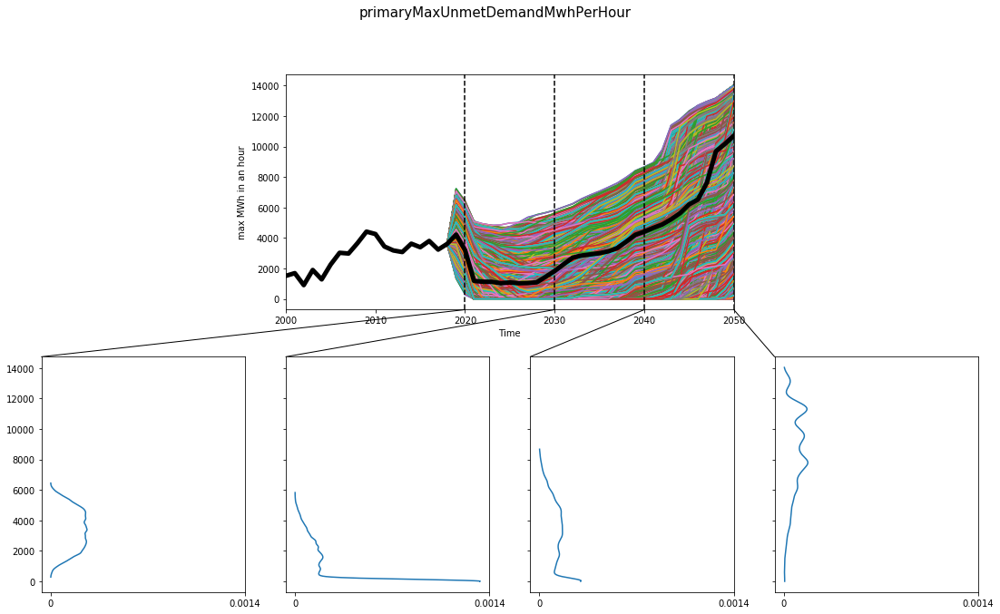

In [42]:
from EMAworkbench.ema_workbench.analysis.plotting import multiple_densities, PlotType
from EMAworkbench.ema_workbench.analysis.plotting_util import Density

fig, ax_env = multiple_densities(experiments, outcomes_filtered, outcomes_to_show = ooi,
                                 points_in_time=points_of_interest,  density = Density.KDE,
                                 grouping_specifiers=None , titles={ooi}, ylabels={ooi: "max MWh in an hour"}, legend=True,
                                 fill=False, plot_type=PlotType.ENV_LIN)

#Change x labels to years
ax_env[ooi]['main plot'].set_xticklabels(time[range(0,len(time),10)])
#Add BAU in the plot with a black wide line
ax_env[ooi]['main plot'].plot(outcomes_filtered[ooi][-1], 'k-',linewidth=5 )

fig[0].suptitle("{}".format(ooi), fontsize=15)
fig[0].set_size_inches(18.5, 10.5)

plt.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', '_future_envelope_line_density_%s'%(ooi)),
                dpi=300, bbox_inches='tight')

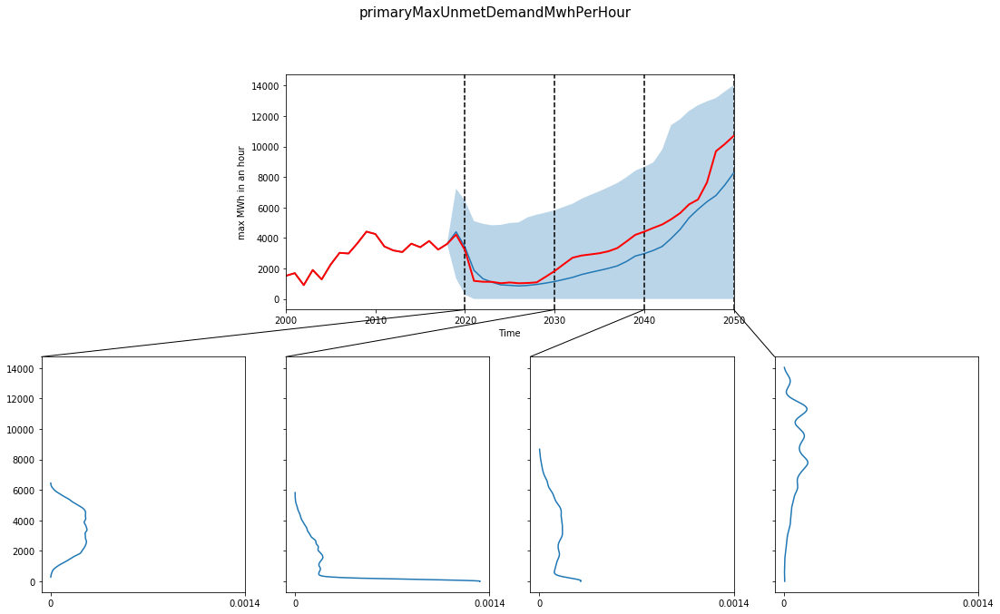

In [43]:
from EMAworkbench.ema_workbench.analysis.plotting import multiple_densities, PlotType
from EMAworkbench.ema_workbench.analysis.plotting_util import Density

fig, ax_env = multiple_densities(experiments, outcomes_filtered, outcomes_to_show = ooi,
                                 points_in_time=points_of_interest,  density = Density.KDE,
                                 grouping_specifiers=None , titles={ooi}, ylabels={ooi: "max MWh in an hour"}, legend=True,
                                 fill=True, plot_type=PlotType.ENVELOPE)

#Change x labels to years
ax_env[ooi]['main plot'].set_xticklabels(time[range(0,len(time),10)])
#Add BAU in the plot with a red wide line
ax_env[ooi]['main plot'].plot(outcomes_filtered[ooi][-1], 'r-',linewidth=2 )


fig[0].suptitle("{}".format(ooi), fontsize=15)
fig[0].set_size_inches(18.5, 10.5)

plt.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', '_future_envelope_density_%s'%(ooi)),
                dpi=300, bbox_inches='tight')

### Unmet Demand - Secondary market unmet demand MWh

In [44]:
# Subset Sool levers
selected_uncertainties = uncertainties

ooi = 'secondaryUnmetDemandMwh'
data = outcomes_filtered[ooi]

num_exp = len(data)
out_avg_ooi = np.zeros(num_exp)

for i in range(num_exp):
    out_avg_ooi[i] = data[i].mean()

exp = pd.DataFrame(experiments)

exp = exp.loc[ :, selected_uncertainties] 

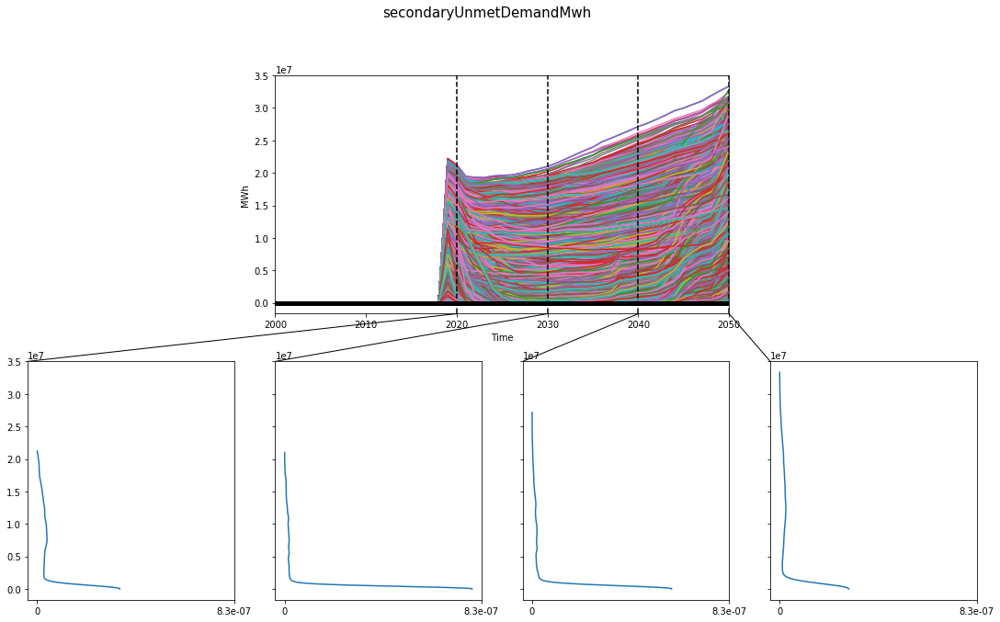

In [45]:
from EMAworkbench.ema_workbench.analysis.plotting import multiple_densities, PlotType
from EMAworkbench.ema_workbench.analysis.plotting_util import Density

fig, ax_env = multiple_densities(experiments, outcomes_filtered, outcomes_to_show = ooi,
                                 points_in_time=points_of_interest,  density = Density.KDE,
                                 grouping_specifiers=None , titles={ooi}, ylabels={ooi: "MWh"}, legend=True,
                                 fill=False, plot_type=PlotType.ENV_LIN)

#Change x labels to years
ax_env[ooi]['main plot'].set_xticklabels(time[range(0,len(time),10)])
#Add BAU in the plot with a black wide line
ax_env[ooi]['main plot'].plot(outcomes_filtered[ooi][-1], 'k-',linewidth=5 )

fig[0].suptitle("{}".format(ooi), fontsize=15)
fig[0].set_size_inches(18.5, 10.5)

plt.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', '_future_envelope_line_density_%s'%(ooi)),
                dpi=300, bbox_inches='tight')

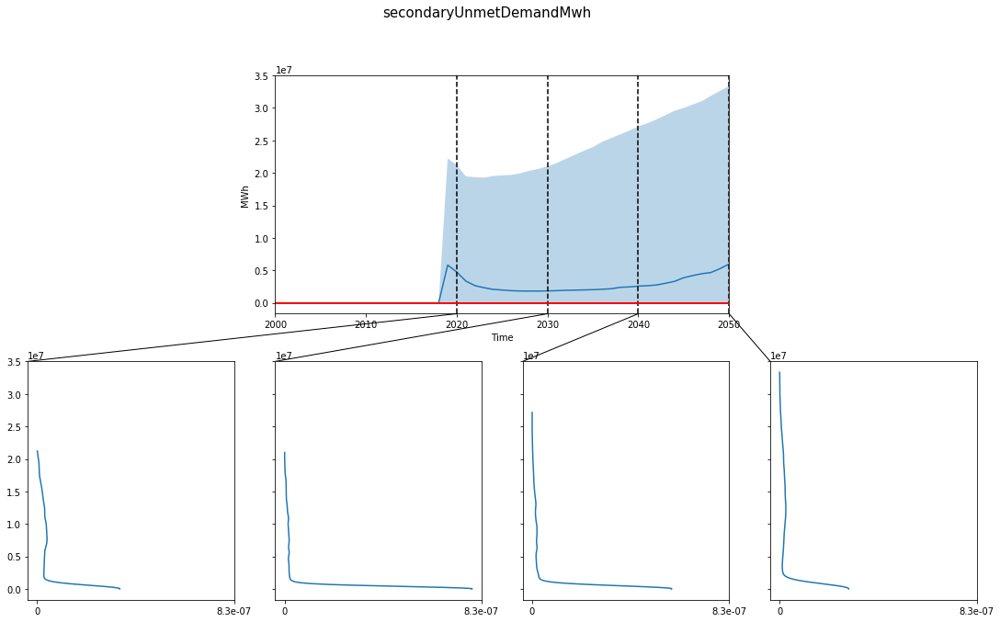

In [46]:
from EMAworkbench.ema_workbench.analysis.plotting import multiple_densities, PlotType
from EMAworkbench.ema_workbench.analysis.plotting_util import Density

fig, ax_env = multiple_densities(experiments, outcomes_filtered, outcomes_to_show = ooi,
                                 points_in_time=points_of_interest,  density = Density.KDE,
                                 grouping_specifiers=None , titles={ooi}, ylabels={ooi: "MWh"}, legend=True,
                                 fill=True, plot_type=PlotType.ENVELOPE)

#Change x labels to years
ax_env[ooi]['main plot'].set_xticklabels(time[range(0,len(time),10)])
#Add BAU in the plot with a red wide line
ax_env[ooi]['main plot'].plot(outcomes_filtered[ooi][-1], 'r-',linewidth=2 )

fig[0].suptitle("{}".format(ooi), fontsize=15)
fig[0].set_size_inches(18.5, 10.5)

plt.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', '_future_envelope_density_%s'%(ooi)),
                dpi=300, bbox_inches='tight')

### Unmet Demand - Secondary market unmet demand (hours)

In [ ]:
# Subset Sool levers
selected_uncertainties = uncertainties

ooi = 'secondaryUnmetDemandHours'
data = outcomes_filtered[ooi]

num_exp = len(data)
out_avg_ooi = np.zeros(num_exp)

for i in range(num_exp):
    out_avg_ooi[i] = data[i].mean()

exp = pd.DataFrame(experiments)

exp = exp.loc[ :, selected_uncertainties] 

In [ ]:
from EMAworkbench.ema_workbench.analysis.plotting import multiple_densities, PlotType
from EMAworkbench.ema_workbench.analysis.plotting_util import Density

fig, ax_env = multiple_densities(experiments, outcomes_filtered, outcomes_to_show = ooi,
                                 points_in_time=points_of_interest,  density = Density.KDE,
                                 grouping_specifiers=None , titles={ooi}, ylabels={ooi: "hours"}, legend=True,
                                 fill=False, plot_type=PlotType.ENV_LIN)

#Change x labels to years
ax_env[ooi]['main plot'].set_xticklabels(time[range(0,len(time),10)])
#Add BAU in the plot with a black wide line
ax_env[ooi]['main plot'].plot(outcomes_filtered[ooi][-1], 'k-',linewidth=5 )

fig[0].suptitle("{}".format(ooi), fontsize=15)
fig[0].set_size_inches(18.5, 10.5)

plt.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', '_future_envelope_line_density_%s'%(ooi)),
                dpi=300, bbox_inches='tight')

In [ ]:
from EMAworkbench.ema_workbench.analysis.plotting import multiple_densities, PlotType
from EMAworkbench.ema_workbench.analysis.plotting_util import Density

fig, ax_env = multiple_densities(experiments, outcomes_filtered, outcomes_to_show = ooi,
                                 points_in_time=points_of_interest,  density = Density.KDE,
                                 grouping_specifiers=None , titles={ooi}, ylabels={ooi: "hours"}, legend=True,
                                 fill=True, plot_type=PlotType.ENVELOPE)

#Change x labels to years
ax_env[ooi]['main plot'].set_xticklabels(time[range(0,len(time),10)])
#Add BAU in the plot with a red wide line
ax_env[ooi]['main plot'].plot(outcomes_filtered[ooi][-1], 'r-',linewidth=2 )

fig[0].suptitle("{}".format(ooi), fontsize=15)
fig[0].set_size_inches(18.5, 10.5)

plt.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', '_future_envelope_density_%s'%(ooi)),
                dpi=300, bbox_inches='tight')

### Unmet Demand - Secondary unmet demand (days)

In [ ]:
# Subset Sool levers
selected_uncertainties = uncertainties

ooi = 'secondaryUnmetDemandDays'
data = outcomes_filtered[ooi]

num_exp = len(data)
out_avg_ooi = np.zeros(num_exp)

for i in range(num_exp):
    out_avg_ooi[i] = data[i].mean()

exp = pd.DataFrame(experiments)

exp = exp.loc[ :, selected_uncertainties] 

In [ ]:
from EMAworkbench.ema_workbench.analysis.plotting import multiple_densities, PlotType
from EMAworkbench.ema_workbench.analysis.plotting_util import Density

fig, ax_env = multiple_densities(experiments, outcomes_filtered, outcomes_to_show = ooi,
                                 points_in_time=points_of_interest,  density = Density.KDE,
                                 grouping_specifiers=None , titles={ooi}, ylabels={ooi: "days"}, legend=True,
                                 fill=False, plot_type=PlotType.ENV_LIN)

#Change x labels to years
ax_env[ooi]['main plot'].set_xticklabels(time[range(0,len(time),10)])
#Add BAU in the plot with a black wide line
ax_env[ooi]['main plot'].plot(outcomes_filtered[ooi][-1], 'k-',linewidth=5 )

fig[0].suptitle("{}".format(ooi), fontsize=15)
fig[0].set_size_inches(18.5, 10.5)

plt.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', '_future_envelope_line_density_%s'%(ooi)),
                dpi=300, bbox_inches='tight')

In [ ]:
from EMAworkbench.ema_workbench.analysis.plotting import multiple_densities, PlotType
from EMAworkbench.ema_workbench.analysis.plotting_util import Density

fig, ax_env = multiple_densities(experiments, outcomes_filtered, outcomes_to_show = ooi,
                                 points_in_time=points_of_interest,  density = Density.KDE,
                                 grouping_specifiers=None , titles={ooi}, ylabels={ooi: "days"}, legend=True,
                                 fill=True, plot_type=PlotType.ENVELOPE)

#Change x labels to years
ax_env[ooi]['main plot'].set_xticklabels(time[range(0,len(time),10)])
#Add BAU in the plot with a red wide line
ax_env[ooi]['main plot'].plot(outcomes_filtered[ooi][-1], 'r-',linewidth=2 )

fig[0].suptitle("{}".format(ooi), fontsize=15)
fig[0].set_size_inches(18.5, 10.5)

plt.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', '_future_envelope_density_%s'%(ooi)),
                dpi=300, bbox_inches='tight')

### Unmet Demand - Secondary market max unmet demand per hour

In [ ]:
# Subset Sool levers
selected_uncertainties = uncertainties

ooi = 'secondaryMaxUnmetDemandMwhPerHour'
data = outcomes_filtered[ooi]

num_exp = len(data)
out_avg_ooi = np.zeros(num_exp)

for i in range(num_exp):
    out_avg_ooi[i] = data[i].mean()

exp = pd.DataFrame(experiments)

exp = exp.loc[ :, selected_uncertainties] 

In [ ]:
from EMAworkbench.ema_workbench.analysis.plotting import multiple_densities, PlotType
from EMAworkbench.ema_workbench.analysis.plotting_util import Density

fig, ax_env = multiple_densities(experiments, outcomes_filtered, outcomes_to_show = ooi,
                                 points_in_time=points_of_interest,  density = Density.KDE,
                                 grouping_specifiers=None , titles={ooi}, ylabels={ooi: "Max Unmet Demand Mwh"}, legend=True,
                                 fill=False, plot_type=PlotType.ENV_LIN)

#Change x labels to years
ax_env[ooi]['main plot'].set_xticklabels(time[range(0,len(time),10)])
#Add BAU in the plot with a black wide line
ax_env[ooi]['main plot'].plot(outcomes_filtered[ooi][-1], 'k-',linewidth=5 )

fig[0].suptitle("{}".format(ooi), fontsize=15)
fig[0].set_size_inches(18.5, 10.5)

plt.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', '_future_envelope_line_density_%s'%(ooi)),
                dpi=300, bbox_inches='tight')

In [ ]:
from EMAworkbench.ema_workbench.analysis.plotting import multiple_densities, PlotType
from EMAworkbench.ema_workbench.analysis.plotting_util import Density

fig, ax_env = multiple_densities(experiments, outcomes_filtered, outcomes_to_show = ooi,
                                 points_in_time=points_of_interest,  density = Density.KDE,
                                 grouping_specifiers=None , titles={ooi}, ylabels={ooi: "Max Unmet Demand Mwh"}, legend=True,
                                 fill=True, plot_type=PlotType.ENVELOPE)

#Change x labels to years
ax_env[ooi]['main plot'].set_xticklabels(time[range(0,len(time),10)])
#Add BAU in the plot with a red wide line
ax_env[ooi]['main plot'].plot(outcomes_filtered[ooi][-1], 'r-',linewidth=2 )

fig[0].suptitle("{}".format(ooi), fontsize=15)
fig[0].set_size_inches(18.5, 10.5)

plt.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', '_future_envelope_density_%s'%(ooi)),
                dpi=300, bbox_inches='tight')

## Directed Search: Prim - Low Carbon Transition (LCT)
* A low carbon transition is the objective. For this, trajectories that lead to low GHGE, high penetration of renewable energiesand a reasonable generation autonomy (in primary markets) are going to be explored. 

1. Victoria's Climate Change Act 2017: “These targets build on the progress that Victoria is already making; emissions are projected to fall to 18% below 2005 levels in 2020.”
The Panel recommends interim targets of:
• 32-39% below 2005 levels in 2025 
• 45-60% below 2005 levels in 2030
• Net-zero by 2050
Lower and upper bounds correspond to 2C and 1.5C emissions trajectories agreed at the COP in Paris in 2015.
2. Victoria Renewable Energy Targets:
* 25% of RE in 2025
* 40% of RE in 2040
* 50% of RE in 2050
3. The objective is to decarbonise the electricity system, for this the generation autonomy of Victoria can be compromised. Other states will be covering the lack of supply from the retirement of the most energy intensive power plants in the Victorian generation pool. With the current committed and proposed generation, the state must accept that its generation autonomy will be highly compromised by mid 2050. Targets in this scenario include:
* A maximum of 2% of the generation will be imported by 2030
* A maximum of 5% of the generation will be imported by 2040
* A maximum of 50% (in the 1.5 C scenario) and 40% (in the 2C scenario)  of the generation will be imported by 2050

### LCT consistent with Paris 1.5 C

In [20]:
##### from EMAworkbench.ema_workbench.analysis import prim
from EMAworkbench.ema_workbench.util import ema_logging
ema_logging.log_to_stderr(ema_logging.INFO);

x = exp
"""
Paris trajectory to 1.5 C 
Filter by GHG (below 39% value of 2005 by 2025)
Filter by GHG (below 60% value of 2005 by 2030)
Filter by net zero GHGE by 2050
"""    
ooi = 'GHGYear'

reference = bau_results_df[bau_results_df['Time (Year)'] == 2005]['GHGYear'].values

reduction = 0.39
ylc_e1 = target_at_year( outcomes_filtered, ooi, 2025, reference - (reference * reduction), False) #False is below target

reduction = 0.60
ylc_e2 = target_at_year( outcomes_filtered, ooi, 2030, reference - (reference * reduction), False) #False is below target

## Net zero
ylc_e3 = target_at_year( outcomes_filtered, ooi, 2050, 5, False) #False is below target

ylc_e = ylc_e1 &  ylc_e2 & ylc_e3 

"""
Filter by renewableContributionYear (above 50%)
The Victorian Renewable Energy Targets (VRET) https://www.energy.vic.gov.au/renewable-energy/victorias-renewable-energy-targets
25% of electricity generated from RE by 2020
40% by 2025
50% by 2030

"""

ooi = 'renewableContributionYear'    

ylc_re1 = target_at_year( outcomes_filtered, ooi, 2025, 0.40, True) #False is below target
#y = target_at_year( outcomes_filtered, ooi, 2030, 21, False) #False is below target
ylc_re2 = target_at_year( outcomes_filtered, ooi, 2030, 0.50, True) #False is below target


ylc_re= ylc_re1 & ylc_re2

""""
Filter by GA of Primary Wholesale Market (aim for: below 2% in 2030, 5% in 2040, and 40% in 2050)
"""

ooi = 'unmetPercentageConsumptionPrimary'    

ylc_gap1 = target_at_year( outcomes_filtered, ooi, 2030, 2, False) #False is below target
ylc_gap2 = target_at_year( outcomes_filtered, ooi, 2040, 5, False) #False is below target
ylc_gap3 = target_at_year( outcomes_filtered, ooi, 2050, 50, False) #False is below target

ylc_gap = ylc_gap1 & ylc_gap2 & ylc_gap3
# """
# Combine Filters
# """
y = ylc_e & ylc_re & ylc_gap

"""
Run PRIM
"""
prim_alg = prim.Prim(x, y, threshold=0.1, threshold_type=prim.ABOVE)
box1 = prim_alg.find_box()


[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 126001 points remaining, containing 21625 cases of interest
[MainProcess/INFO] mean: 0.724784290389765, mass: 0.05334878294616709, coverage: 0.22529479768786126, density: 0.724784290389765 restricted_dimensions: 14


In [21]:
box1.inspect_tradeoff()

alt.VConcatChart(...)

coverage    0.439353
density     0.603852
id                22
mass        0.124872
mean        0.603852
res_dim           12
Name: 22, dtype: object

                               box 22         \
                                  min    max   
generatorRetirement              -5.0    2.5   
priceChangePercentageWind       -50.0   44.5   
domesticConsumptionPercentage     0.0   48.5   
nameplateCapacityChangeOcgt     -50.0   44.5   
priceChangePercentageWater      -50.0   44.5   
nonScheduleMinCapMarketGen        0.1  142.5   
includePublicallyAnnouncedGen     0.5    1.0   
nameplateCapacityChangeWind     -20.5   50.0   
learningCurve                     1.5   15.0   
nameplateCapacityChangeWater    -40.5   50.0   
priceChangePercentageBrownCoal  -46.5   50.0   
nameplateCapacityChangeSolar    -45.5   44.5   

                                                                            
                                                                 qp values  
generatorRetirement   

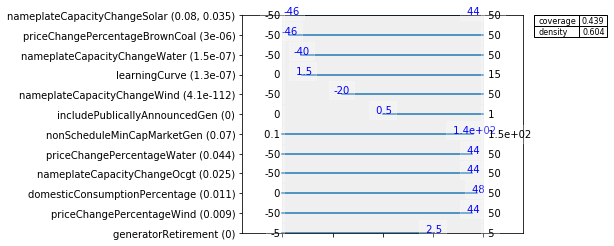

In [23]:
#%matplotlib inline
selected_box = 22

box_1 = box1.inspect(selected_box)
box_1 = box1.inspect(selected_box, style='graph')


Score Using all inputs

In [110]:
experimentsInBox = BoxExperimentsScores(box1, selected_box, y, True) # True uses all inputs to compute the score

In [111]:
boxInputLimits = [key for key, value in box1.qp[selected_box].items()]  
experimentsInBox[ boxInputLimits + ['score'] ]

,domesticConsumptionPercentage,generatorRetirement,includePublicallyAnnouncedGen,learningCurve,nameplateCapacityChangeOcgt,nameplateCapacityChangeSolar,nameplateCapacityChangeWater,nameplateCapacityChangeWind,nonScheduleMinCapMarketGen,priceChangePercentageBrownCoal,priceChangePercentageWater,priceChangePercentageWind,score
512,33.0,-1.0,1.0,12.0,1.0,3.0,-10.0,13.0,24.0,-2.0,21.0,-4.0,4.350981
4249,21.0,-3.0,1.0,14.0,-2.0,-13.0,-30.0,19.0,1.0,-2.0,-9.0,9.0,5.081223
508,33.0,-1.0,1.0,12.0,1.0,3.0,-4.0,13.0,24.0,45.0,21.0,-4.0,5.090981
513,33.0,-1.0,1.0,12.0,1.0,3.0,-10.0,13.0,24.0,45.0,21.0,-4.0,5.110981
5477,28.0,-4.0,1.0,2.0,17.0,-20.0,-22.0,-3.0,12.0,15.0,-27.0,17.0,5.139013
3678,26.0,-5.0,1.0,7.0,35.0,-16.0,-2.0,26.0,10.0,0.0,24.0,-5.0,5.154327
521,33.0,-1.0,1.0,12.0,1.0,3.0,-10.0,13.0,24.0,45.0,21.0,-4.0,5.159941
498,33.0,-1.0,1.0,12.0,1.0,3.0,-10.0,13.0,24.0,45.0,21.0,-4.0,5.170981
495,33.0,-1.0,1.0,12.0,1.0,3.0,-10.0,13.0,24.0,45.0,21.0,-4.0,5.173457
509,33.0,-1.0,1.0,12.0,1.0,3.0,-10.0,13.0,24.0,45.0,21.0,-4.0,5.177647


Score using only inputs from the selected box

In [112]:
experimentsInBox = BoxExperimentsScores(box1, selected_box, y, False) # False uses only box inputs to compute the score

In [113]:
boxInputLimits = [key for key, value in box1.qp[selected_box].items()]  
experimentsInBox[ boxInputLimits + ['score'] ]

,domesticConsumptionPercentage,generatorRetirement,includePublicallyAnnouncedGen,learningCurve,nameplateCapacityChangeOcgt,nameplateCapacityChangeSolar,nameplateCapacityChangeWater,nameplateCapacityChangeWind,nonScheduleMinCapMarketGen,priceChangePercentageBrownCoal,priceChangePercentageWater,priceChangePercentageWind,score
781,25.0,-5.0,1.0,5.0,2.0,9.0,28.0,-3.0,6.0,-3.0,19.0,1.0,1.580539
512,33.0,-1.0,1.0,12.0,1.0,3.0,-10.0,13.0,24.0,-2.0,21.0,-4.0,1.735753
1228,21.0,-2.0,1.0,9.0,11.0,-12.0,-15.0,4.0,7.0,-17.0,-5.0,-7.0,1.782874
773,25.0,-5.0,1.0,5.0,2.0,9.0,-19.0,-3.0,6.0,-3.0,19.0,32.0,2.020539
4249,21.0,-3.0,1.0,14.0,-2.0,-13.0,-30.0,19.0,1.0,-2.0,-9.0,9.0,2.036136
6602,31.0,-3.0,1.0,6.0,0.0,-23.0,1.0,0.0,13.0,23.0,-33.0,5.0,2.045976
6600,31.0,-3.0,1.0,6.0,0.0,7.0,1.0,-20.0,13.0,23.0,-33.0,5.0,2.125976
1232,30.0,0.0,1.0,11.0,-20.0,10.0,5.0,16.0,2.0,-35.0,-2.0,-11.0,2.128699
778,25.0,-5.0,1.0,5.0,2.0,9.0,28.0,-3.0,6.0,-1.0,19.0,32.0,2.160539
765,25.0,-3.0,1.0,5.0,2.0,9.0,28.0,-3.0,6.0,-3.0,19.0,32.0,2.160539


In [28]:
experiments.loc[4111]

annualCpi                               3
annualInflation                         1
consumption                             2
domesticConsumptionPercentage          33
energyEfficiency                        2
generationRolloutPeriod                10
generatorRetirement                     4
importPriceFactor                       5
includePublicallyAnnouncedGen           1
learningCurve                           1
model                               Gr4sp
nameplateCapacityChangeBattery        -40
nameplateCapacityChangeBrownCoal       -7
nameplateCapacityChangeOcgt           -37
nameplateCapacityChangeSolar            3
nameplateCapacityChangeWater            0
nameplateCapacityChangeWind            -5
nonScheduleGenSpotMarket               10
nonScheduleMinCapMarketGen             78
policy                                  0
priceChangePercentageBattery            7
priceChangePercentageBrownCoal          4
priceChangePercentageOcgt              -3
priceChangePercentageWater        

In [102]:
experiments.loc[bau_scenario_id]

annualCpi                             2.33
annualInflation                        3.3
consumption                              0
domesticConsumptionPercentage           30
energyEfficiency                         0
generationRolloutPeriod                  1
generatorRetirement                      0
importPriceFactor                       29
includePublicallyAnnouncedGen            0
learningCurve                            5
model                                Gr4sp
nameplateCapacityChangeBattery           0
nameplateCapacityChangeBrownCoal         0
nameplateCapacityChangeOcgt              0
nameplateCapacityChangeSolar             0
nameplateCapacityChangeWater             0
nameplateCapacityChangeWind              0
nonScheduleGenSpotMarket                10
nonScheduleMinCapMarketGen               1
policy                                   0
priceChangePercentageBattery             0
priceChangePercentageBrownCoal           0
priceChangePercentageOcgt                0
priceChange

domesticConsumptionPercentage
generatorRetirement
includePublicallyAnnouncedGen


C:\Users\angel\Anaconda3\lib\site-packages\seaborn\axisgrid.py:1559: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

C:\Users\angel\Anaconda3\lib\site-packages\seaborn\axisgrid.py:1559: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

C:\Users\angel\Anaconda3\lib\site-packages\seaborn\axisgrid.py:1559: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.m

learningCurve


C:\Users\angel\Anaconda3\lib\site-packages\seaborn\axisgrid.py:1559: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

C:\Users\angel\Anaconda3\lib\site-packages\seaborn\axisgrid.py:1559: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

C:\Users\angel\Anaconda3\lib\site-packages\seaborn\axisgrid.py:1559: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.m

nameplateCapacityChangeOcgt


C:\Users\angel\Anaconda3\lib\site-packages\seaborn\axisgrid.py:1559: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

C:\Users\angel\Anaconda3\lib\site-packages\seaborn\axisgrid.py:1559: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

C:\Users\angel\Anaconda3\lib\site-packages\seaborn\axisgrid.py:1559: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.m

nameplateCapacityChangeSolar


C:\Users\angel\Anaconda3\lib\site-packages\seaborn\axisgrid.py:1559: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

C:\Users\angel\Anaconda3\lib\site-packages\seaborn\axisgrid.py:1559: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

C:\Users\angel\Anaconda3\lib\site-packages\seaborn\axisgrid.py:1559: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.m

nameplateCapacityChangeWater


C:\Users\angel\Anaconda3\lib\site-packages\seaborn\axisgrid.py:1559: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

C:\Users\angel\Anaconda3\lib\site-packages\seaborn\axisgrid.py:1559: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

C:\Users\angel\Anaconda3\lib\site-packages\seaborn\axisgrid.py:1559: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.m

nameplateCapacityChangeWind


C:\Users\angel\Anaconda3\lib\site-packages\seaborn\axisgrid.py:1559: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

C:\Users\angel\Anaconda3\lib\site-packages\seaborn\axisgrid.py:1559: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

C:\Users\angel\Anaconda3\lib\site-packages\seaborn\axisgrid.py:1559: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.m

nonScheduleMinCapMarketGen


C:\Users\angel\Anaconda3\lib\site-packages\seaborn\axisgrid.py:1559: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

C:\Users\angel\Anaconda3\lib\site-packages\seaborn\axisgrid.py:1559: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

C:\Users\angel\Anaconda3\lib\site-packages\seaborn\axisgrid.py:1559: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.m

priceChangePercentageBrownCoal


C:\Users\angel\Anaconda3\lib\site-packages\seaborn\axisgrid.py:1559: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

C:\Users\angel\Anaconda3\lib\site-packages\seaborn\axisgrid.py:1559: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

C:\Users\angel\Anaconda3\lib\site-packages\seaborn\axisgrid.py:1559: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.m

priceChangePercentageWater


C:\Users\angel\Anaconda3\lib\site-packages\seaborn\axisgrid.py:1559: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

C:\Users\angel\Anaconda3\lib\site-packages\seaborn\axisgrid.py:1559: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

C:\Users\angel\Anaconda3\lib\site-packages\seaborn\axisgrid.py:1559: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.m

priceChangePercentageWind


C:\Users\angel\Anaconda3\lib\site-packages\seaborn\axisgrid.py:1559: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

C:\Users\angel\Anaconda3\lib\site-packages\seaborn\axisgrid.py:1559: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

C:\Users\angel\Anaconda3\lib\site-packages\seaborn\axisgrid.py:1559: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.m

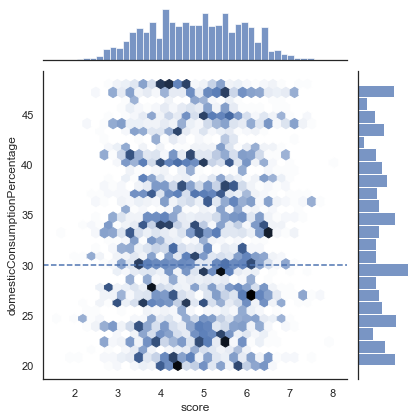

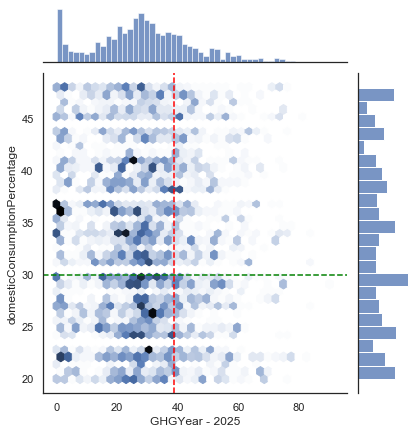

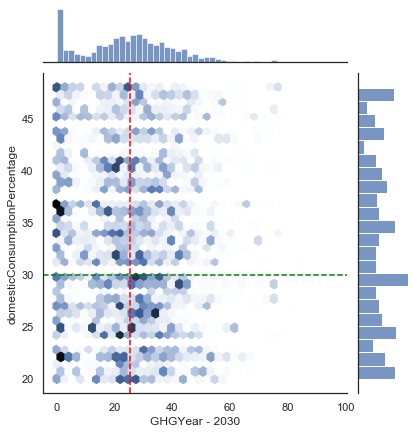

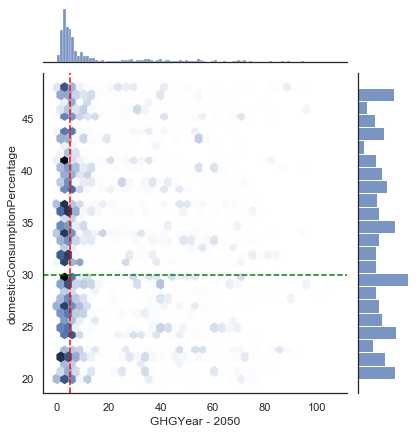

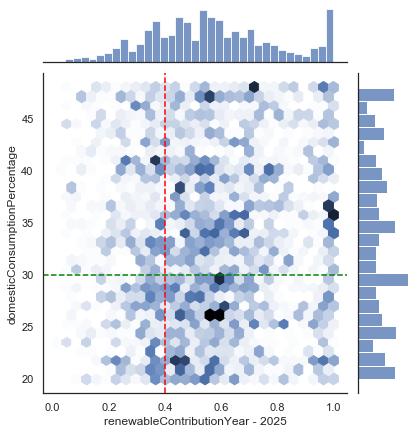

...

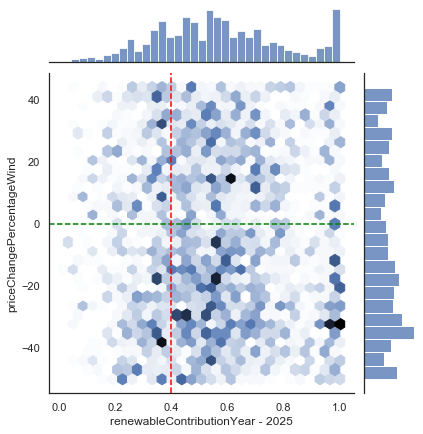

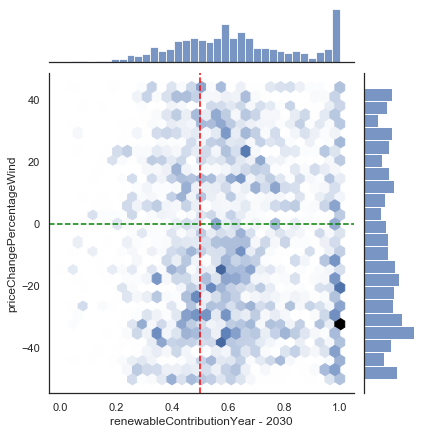

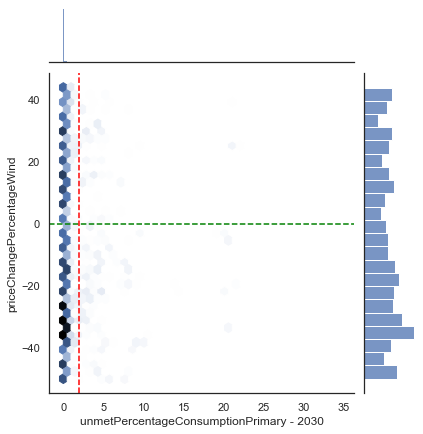

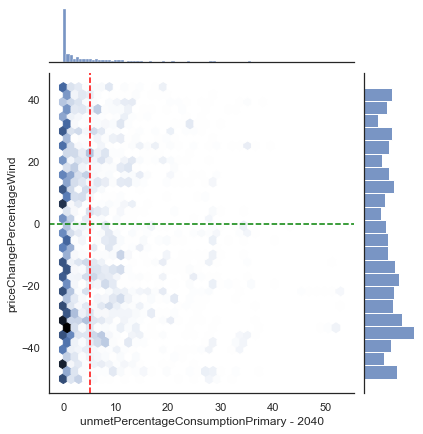

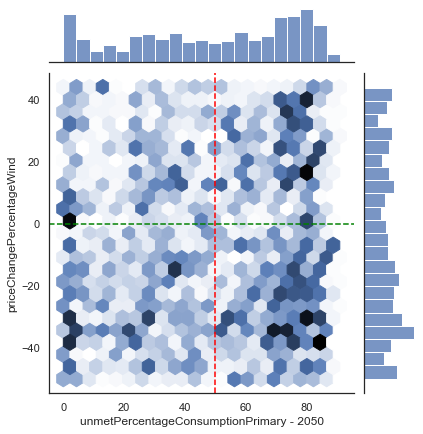

In [114]:
# Create a pair plot colored by continent with a density plot of the # diagonal and format the scatter plots.
# sns.pairplot(experimentsInBox[ boxInputLimits + ['score', 'bauQuadrant'] ], hue = 'bauQuadrant', diag_kind = 'kde',
#              plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'k'},
#              size = 4)


for inp in boxInputLimits:
    print(inp)
    
    
    g = sns.jointplot(x=experimentsInBox["score"], y=experimentsInBox[inp],  kind="hex")
    g.ax_joint.axhline(experiments.loc[bau_scenario_id][inp], ls='--')

    # Plot inputs and targets
    reference = bau_results_df[bau_results_df['Time (Year)'] == 2005]['GHGYear'].values
    refLine = reference - (reference * 0.39)    
    plotInputTargetBox('GHGYear', 2025, refLine)
    
    refLine = reference - (reference * 0.6)
    plotInputTargetBox('GHGYear', 2030, refLine)
    
    plotInputTargetBox('GHGYear', 2050, 5)

    plotInputTargetBox('renewableContributionYear', 2025, 0.4)
    plotInputTargetBox('renewableContributionYear', 2030, 0.5)
    
    plotInputTargetBox('unmetPercentageConsumptionPrimary', 2030, 2)
    plotInputTargetBox('unmetPercentageConsumptionPrimary', 2040, 5)
    plotInputTargetBox('unmetPercentageConsumptionPrimary', 2050, 50)    
    




"The quasi-p-value test, essentially a one sided binomial test, is an estimate of the likelihood that a given uncertainty is included in the definition of the subspace purely by chance." (Bryant and Lempert, 2010)
"
“qp-value” test thus answers the question: what is the probability that Tpoints drawn from the above binomial distribution would have H or more high valued points? When the ratio $H_{-j}$/$T_{-j}$ is close to H/T this number is high, the additional contribution of parameter $r_j$ is low, and thus possibly due to chance. The opposite is the case when H/T is much larger than  $H_{-j}$/$T_{-j}$." (Bryant and Lempert, 2010)

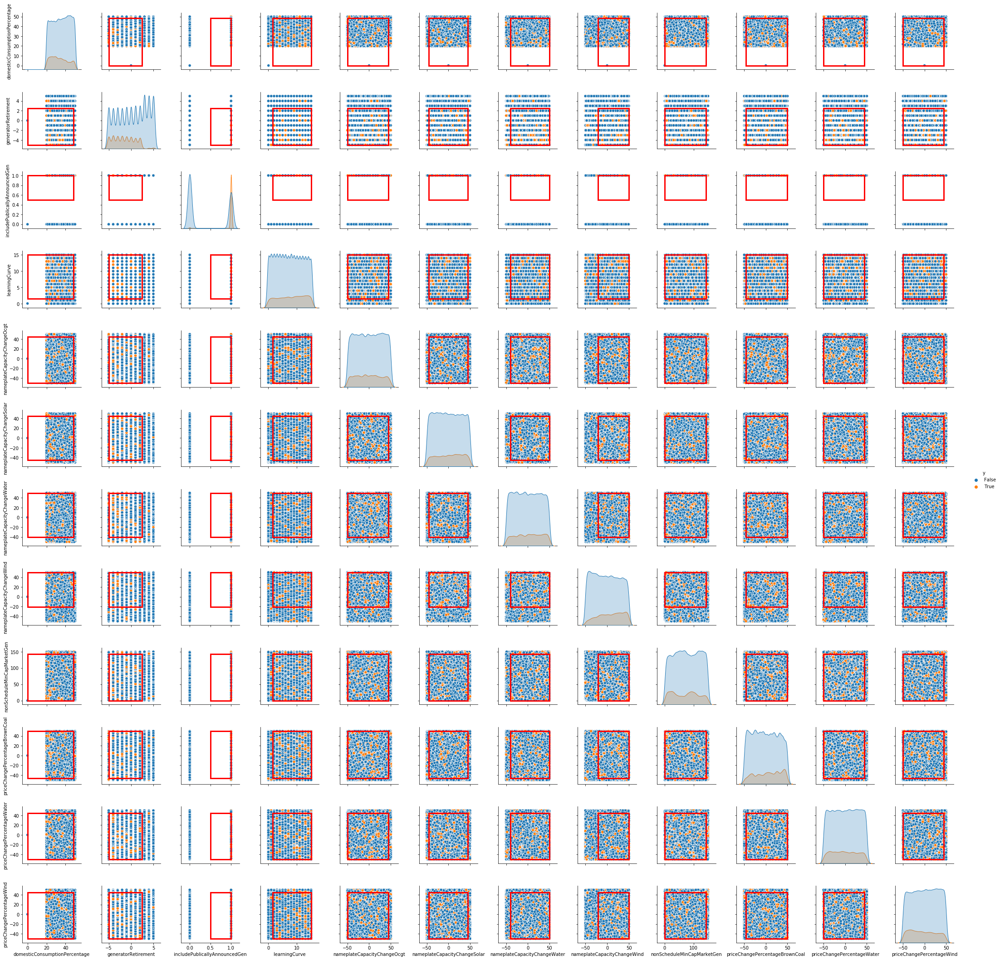

In [27]:
box1.select(selected_box)
fig = box1.show_pairs_scatter(selected_box)

plt.show()


#### BAU vs 1.5 LCT

In [37]:
lct_results_df = pd.read_csv(r'C:/Users/angel/Documents/GitHub/gr4sp/csv/LCTVIC/LCTVICSimDataYearSummary_seed_1613443578132.csv')

""" Converts household data in tCO2e into total residential data in MtCO2e"""
data_GHG_residential_lct = (lct_results_df['GHG Emissions (tCO2-e) per household'] * lct_results_df['Number of Domestic Consumers (households)']) / 1000000.0

""" Applies scaling factor used in simulation, so that data represents total emissions, not only residential (30%)"""
data_GHG_total_lct = data_GHG_residential_lct / 0.3

"""Overwrite GHG with the data of interest"""
lct_results_df['GHGYear'] = data_GHG_total_lct

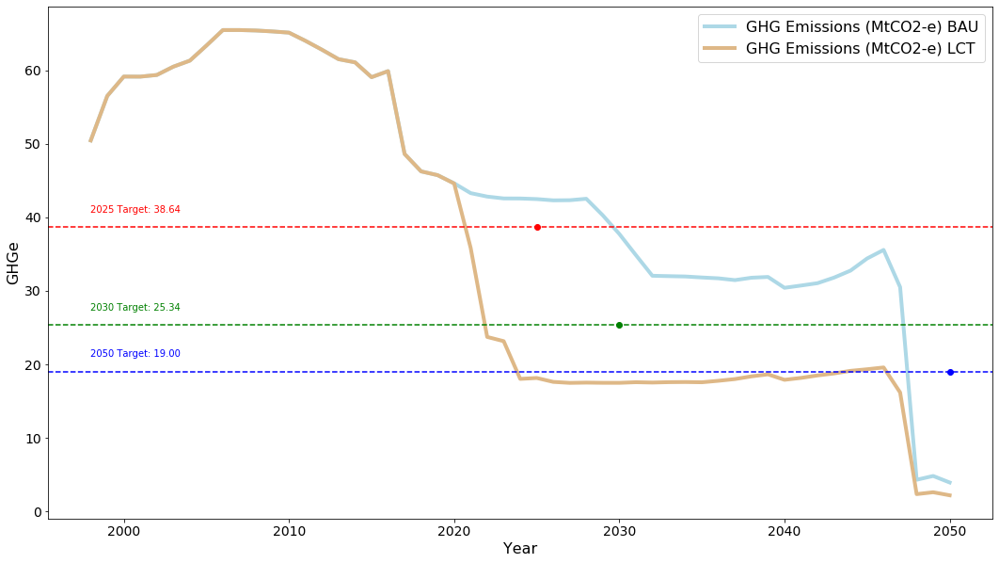

In [56]:
plt.figure(figsize=(18,10))
years = [DT.datetime.strptime(str(int(date)),'%Y') for date in bau_results_df['Time (Year)'].values]
years =  bau_results_df['Time (Year)'].values
plt.plot( years, bau_results_df['GHGYear'], markerfacecolor='lightblue', color='lightblue', linewidth=4, label='GHG Emissions (MtCO2-e) BAU')
plt.plot( years, lct_results_df['GHGYear'], markerfacecolor='darkgoldenrod',  color='burlywood', linewidth=4, label='GHG Emissions (MtCO2-e) LCT')


# Add dot and corresponding text
reference = bau_results_df[bau_results_df['Time (Year)'] == 2005]['GHGYear'].values

reduction = 0.39

plt.axhline((reference - (reference * reduction)), ls='--',color='red')

plt.text(years[0], reference - (reference * reduction)+2, f'2025 Target: {((reference - (reference * reduction))[0]):.2f}',color='red')
plt.plot(2025, (reference - (reference * reduction)), 'ro')


reduction = 0.60

plt.axhline((reference - (reference * reduction)) ,ls='--',color='green')
plt.text(years[0], reference - (reference * reduction)+2, f'2030 Target: {((reference - (reference * reduction))[0]):.2f}',color='green')
plt.plot(2030, (reference - (reference * reduction)), 'go')

reduction = 0.7
plt.axhline((reference - (reference * reduction)) ,ls='--',color='blue')
plt.text(years[0], reference - (reference * reduction)+2, f'2050 Target: {((reference - (reference * reduction))[0]):.2f}',color='blue')
plt.plot(2050, (reference - (reference * reduction)), 'bo')

#plt.axvline(2019, ls='-',color='black')

#plt.grid( linestyle='-', linewidth=1)
plt.xlabel('Year', size=16)
plt.ylabel('GHGe', size=16)
plt.xticks(size = 14)
plt.yticks(size = 14)
plt.legend(prop={'size':16})

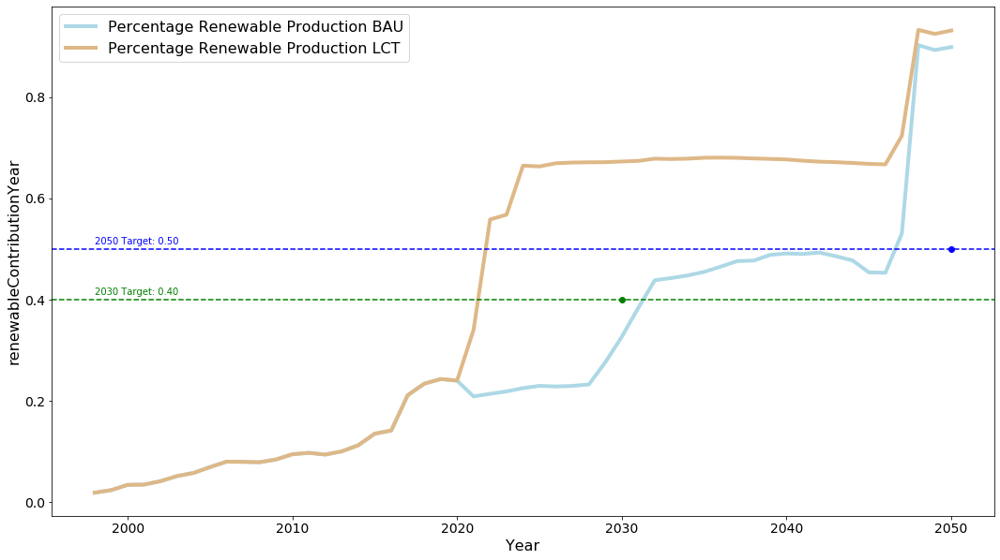

In [39]:
plt.figure(figsize=(18,10))
years = [DT.datetime.strptime(str(int(date)),'%Y') for date in bau_results_df['Time (Year)'].values]
years =  bau_results_df['Time (Year)'].values
plt.plot( years, bau_results_df['Percentage Renewable Production'], markerfacecolor='lightblue', color='lightblue', linewidth=4, label='Percentage Renewable Production BAU')
plt.plot( years, lct_results_df['Percentage Renewable Production'], markerfacecolor='darkgoldenrod',  color='burlywood', linewidth=4, label='Percentage Renewable Production LCT')

# Add dot and corresponding text

target = 0.40

plt.axhline(  target ,ls='--',color='green')
plt.text(years[0], target+0.01, f'2030 Target: {target:.2f}',color='green')
plt.plot(2030, target, 'go')

target = 0.5
plt.axhline(  target ,ls='--',color='blue')
plt.text(years[0], target+0.01, f'2050 Target: {target:.2f}',color='blue')
plt.plot(2050, target, 'bo')

#plt.grid( linestyle='-', linewidth=1)
plt.xlabel('Year', size=16)
plt.ylabel('renewableContributionYear', size=16)
plt.xticks(size = 14)
plt.yticks(size = 14)
plt.legend(prop={'size':16})

### LCT consistent with Paris 2C

In [22]:
from EMAworkbench.ema_workbench.analysis import prim
from EMAworkbench.ema_workbench.util import ema_logging
ema_logging.log_to_stderr(ema_logging.INFO);

x = exp
"""
Paris trajectory to 2 C
Filter by GHG (below 32% value of 2005 by 2025)
Filter by GHG (below 45% value of 2005 by 2030)
Filter by net zero GHGE by 2050

"""    
ooi = 'GHGYear'

reference = bau_results_df[bau_results_df['Time (Year)'] == 2005]['GHGYear'].values

reduction = 0.32
ylc_e1 = target_at_year( outcomes_filtered, ooi, 2025, reference - (reference * reduction), False) #False is below target

reduction = 0.45
ylc_e2 = target_at_year( outcomes_filtered, ooi, 2030, reference - (reference * reduction), False) #False is below target

ylc_e3 = target_at_year( outcomes_filtered, ooi, 2050, 5, False) #False is below target

ylc_e = ylc_e1 &  ylc_e2 & ylc_e3 

"""
Filter by renewableContributionYear (above 50%)
The Victorian Renewable Energy Targets (VRET) https://www.energy.vic.gov.au/renewable-energy/victorias-renewable-energy-targets
25% of electricity generated from RE by 2020
40% by 2025
50% by 2030

"""

ooi = 'renewableContributionYear'    

ylc_re1 = target_at_year( outcomes_filtered, ooi, 2025, 0.40, True) #False is below target
ylc_re2 = target_at_year( outcomes_filtered, ooi, 2030, 0.50, True) #False is below target

ylc_re= ylc_re1 & ylc_re2

""""
Filter by GA of Primary Wholesale Market (aim for: below 2% in 2030, 5% in 2040, and 40% in 2050)
"""

ooi = 'unmetPercentageConsumptionPrimary'    

ylc_gap1 = target_at_year( outcomes_filtered, ooi, 2030, 2, False) #False is below target
ylc_gap2 = target_at_year( outcomes_filtered, ooi, 2040, 5, False) #False is below target
ylc_gap3 = target_at_year( outcomes_filtered, ooi, 2050, 35, False) #False is below target

ylc_gap = ylc_gap1 & ylc_gap2 & ylc_gap3

# """
# Combine Filters
# """
y = ylc_e & ylc_re & ylc_gap
# """

"""
Run PRIM
"""
prim_alg = prim.Prim(x, y, threshold=0.1, threshold_type=prim.ABOVE)
box1 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 126001 points remaining, containing 16552 cases of interest
[MainProcess/INFO] mean: 0.6990543014032947, mass: 0.05203133308465806, coverage: 0.2768849685838569, density: 0.6990543014032947 restricted_dimensions: 9


In [23]:
box1.inspect_tradeoff()

alt.VConcatChart(...)

coverage    0.477948
density     0.597688
id                24
mass        0.105047
mean        0.597688
res_dim            8
Name: 24, dtype: object

                               box 24        \
                                  min   max   
domesticConsumptionPercentage    20.0  48.5   
nameplateCapacityChangeOcgt     -50.0  45.5   
priceChangePercentageWind       -50.0  44.5   
includePublicallyAnnouncedGen     0.5   1.0   
nameplateCapacityChangeWind       3.5  50.0   
generatorRetirement              -4.5   2.5   
priceChangePercentageBrownCoal  -39.5  50.0   
nameplateCapacityChangeWater    -45.5  50.0   

                                                                                  
                                                                       qp values  
domesticConsumptionPercentage                      [-1.0, 0.0005073780846608484]  
nameplateCapacityChangeOcgt                        [-1.0, 0.0005843647564964796]  
priceChangePercentageWind                     

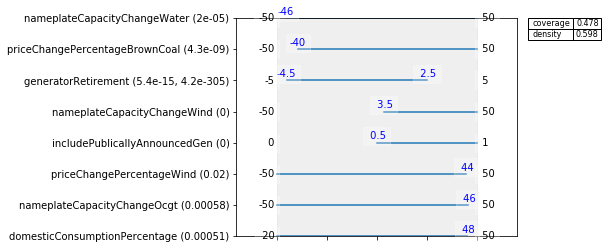

In [24]:
#%matplotlib inline
selected_box = 24

box_1 = box1.inspect(selected_box)
box_1 = box1.inspect(selected_box, style='graph')


#### BAU VS 2C LCT

In [150]:
lct_results_df = pd.read_csv(r'C:/Users/angel/Documents/GitHub/gr4sp/csv/LCTVIC/LCTVICSimDataYearSummary_seed_1613443578132.csv')

""" Converts household data in tCO2e into total residential data in MtCO2e"""
data_GHG_residential_lct = (lct_results_df['GHG Emissions (tCO2-e) per household'] * lct_results_df['Number of Domestic Consumers (households)']) / 1000000.0

""" Applies scaling factor used in simulation, so that data represents total emissions, not only residential (30%)"""
data_GHG_total_lct = data_GHG_residential_lct / 0.3

"""Overwrite GHG with the data of interest"""
lct_results_df['GHGYear'] = data_GHG_total_lct

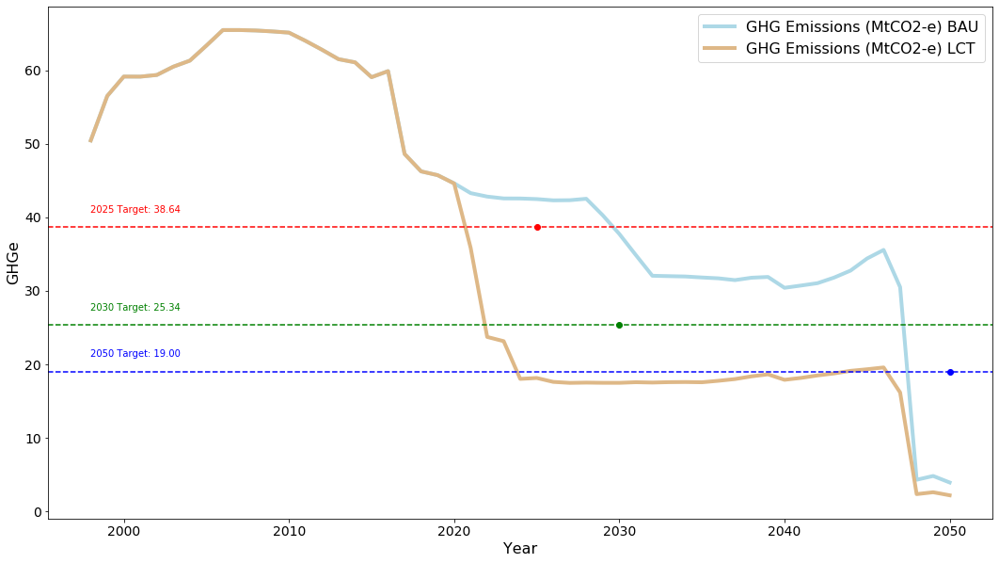

In [151]:
plt.figure(figsize=(18,10))
years = [DT.datetime.strptime(str(int(date)),'%Y') for date in bau_results_df['Time (Year)'].values]
years =  bau_results_df['Time (Year)'].values
plt.plot( years, bau_results_df['GHGYear'], markerfacecolor='lightblue', color='lightblue', linewidth=4, label='GHG Emissions (MtCO2-e) BAU')
plt.plot( years, lct_results_df['GHGYear'], markerfacecolor='darkgoldenrod',  color='burlywood', linewidth=4, label='GHG Emissions (MtCO2-e) LCT')

# Add dot and corresponding text
reference = bau_results_df[bau_results_df['Time (Year)'] == 2005]['GHGYear'].values

reduction = 0.39

plt.axhline(  (reference - (reference * reduction)) ,ls='--',color='red')
plt.text(years[0], reference - (reference * reduction)+2, f'2025 Target: {((reference - (reference * reduction))[0]):.2f}',color='red')
plt.plot(2025, (reference - (reference * reduction)), 'ro')


reduction = 0.60

plt.axhline(  (reference - (reference * reduction)) ,ls='--',color='green')
plt.text(years[0], reference - (reference * reduction)+2, f'2030 Target: {((reference - (reference * reduction))[0]):.2f}',color='green')
plt.plot(2030, (reference - (reference * reduction)), 'go')

reduction = 0.7
plt.axhline(  (reference - (reference * reduction)) ,ls='--',color='blue')
plt.text(years[0], reference - (reference * reduction)+2, f'2050 Target: {((reference - (reference * reduction))[0]):.2f}',color='blue')
plt.plot(2050, (reference - (reference * reduction)), 'bo')

#plt.grid( linestyle='-', linewidth=1)
plt.xlabel('Year', size=16)
plt.ylabel('GHGe', size=16)
plt.xticks(size = 14)
plt.yticks(size = 14)
plt.legend(prop={'size':16})

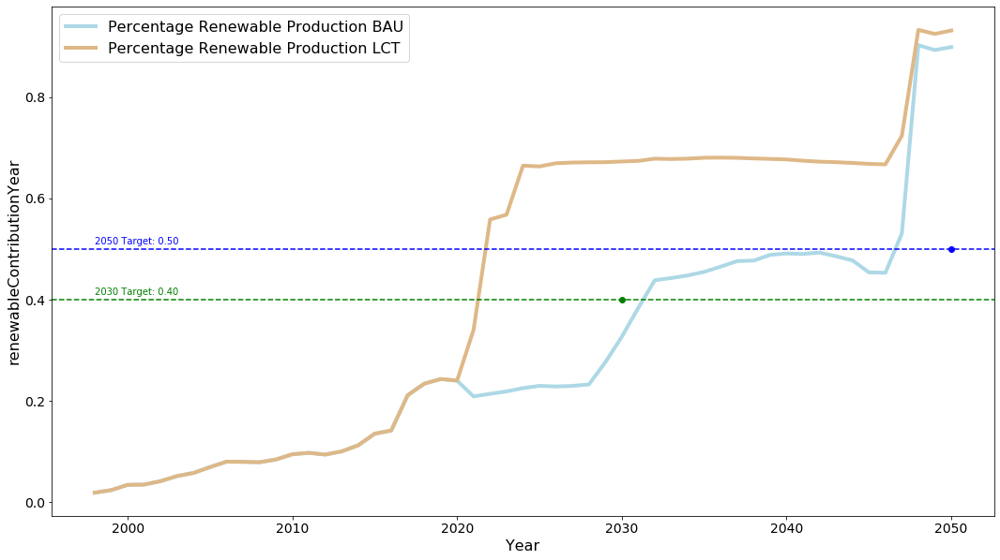

In [152]:
plt.figure(figsize=(18,10))
years = [DT.datetime.strptime(str(int(date)),'%Y') for date in bau_results_df['Time (Year)'].values]
years =  bau_results_df['Time (Year)'].values
plt.plot( years, bau_results_df['Percentage Renewable Production'], markerfacecolor='lightblue', color='lightblue', linewidth=4, label='Percentage Renewable Production BAU')
plt.plot( years, lct_results_df['Percentage Renewable Production'], markerfacecolor='darkgoldenrod',  color='burlywood', linewidth=4, label='Percentage Renewable Production LCT')

# Add dot and corresponding text

target = 0.40

plt.axhline(  target ,ls='--',color='green')
plt.text(years[0], target+0.01, f'2030 Target: {target:.2f}',color='green')
plt.plot(2030, target, 'go')

target = 0.5
plt.axhline(  target ,ls='--',color='blue')
plt.text(years[0], target+0.01, f'2050 Target: {target:.2f}',color='blue')
plt.plot(2050, target, 'bo')

#plt.grid( linestyle='-', linewidth=1)
plt.xlabel('Year', size=16)
plt.ylabel('renewableContributionYear', size=16)
plt.xticks(size = 14)
plt.yticks(size = 14)
plt.legend(prop={'size':16})

### Feature Scoring

In [147]:
from EMAworkbench.ema_workbench.analysis import feature_scoring

fs, alg = feature_scoring.get_ex_feature_scores(x, y, mode=feature_scoring.RuleInductionType.CLASSIFICATION)
fs.sort_values(ascending=False, by=1)



[MainProcess/INFO] model dropped from analysis because only a single category


ValueError: Input contains NaN, infinity or a value too large for dtype('float32').

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] policy dropped from analysis because only a single category


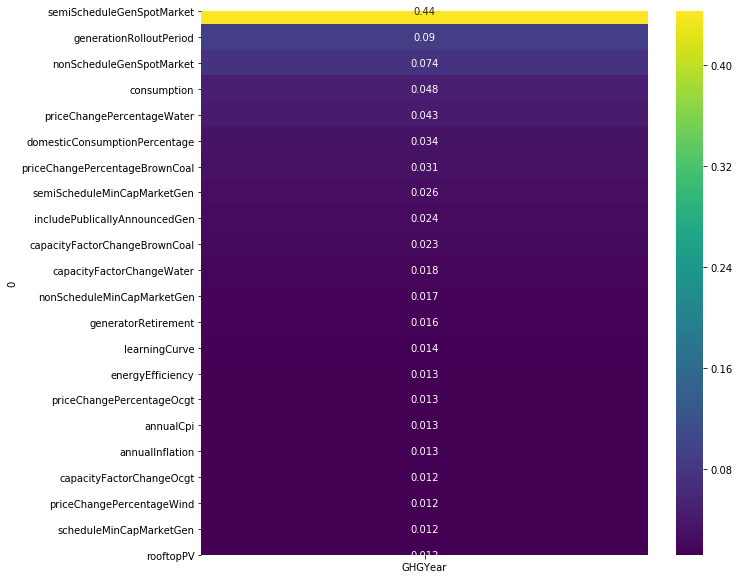

In [157]:
x = exp
y_all = {}

#plot using ALL simulations
#y_all['GHGYear'] = data

#plot using average of ALL simulations
#y_all['GHGYear'] = out_avg_ooi

#Plot using only target simulations
y_all['GHGYear'] = y

fig, ax = plt.subplots(figsize=(10,10))
fs = feature_scoring.get_feature_scores_all(x, y_all)
sns.heatmap(fs, cmap='viridis', annot=True, ax=ax)
plt.show()

### Dimensional Stacking


[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] policy dropped from analysis because only a single category


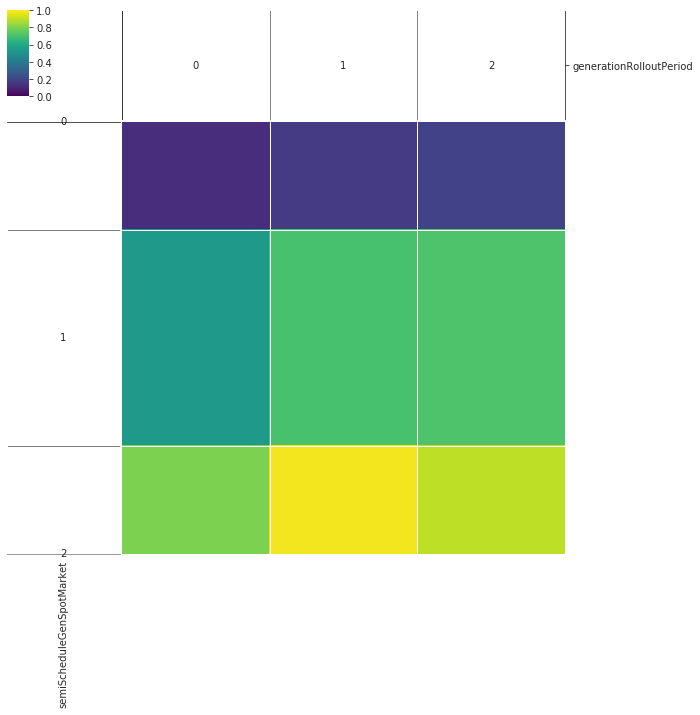

In [159]:

from EMAworkbench.ema_workbench.analysis import dimensional_stacking

x = exp
dimensional_stacking.create_pivot_plot(x,y, 1, nbins=3)
plt.show()



## Direct search: PRIM - Just Transition (JT)
Includes trajectories with low tarifffs, EV and good autonomy of secondary markets

In [25]:
from EMAworkbench.ema_workbench.analysis import prim
from EMAworkbench.ema_workbench.util import ema_logging
ema_logging.log_to_stderr(ema_logging.INFO);

x = exp

"""
Filter by Energy Vulnerability (below median)
"""
ooi = 'Energy Vulnerability Percentage'    

median_ev = 0.300779648
yjt_ev1= target_at_year( outcomes_filtered, ooi, 2030, median_ev, False) #False is below target


""""
Filter GA of Secondary Wholesale Market (below 50% of electricity to be imported using percentage of unmet demand/consumption)
"""

ooi = 'unmetPercentageConsumptionSecondary'    

yjt_gas1 = target_at_year( outcomes_filtered, ooi, 2040, 50, False) #False is below target
yjt_gas2 = target_at_year( outcomes_filtered, ooi, 2040, 0.001, True)


# """
# Combine Filters
# """
y = yjt_ev1 & yjt_gas1 & yjt_gas2

"""
Run PRIM
"""
prim_alg = prim.Prim(x, y, threshold=0.1, threshold_type=prim.ABOVE)
box1 = prim_alg.find_box()


[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 126001 points remaining, containing 20283 cases of interest
[MainProcess/INFO] mean: 0.8261964735516373, mass: 0.053563066959786035, coverage: 0.2749100231721146, density: 0.8261964735516373 restricted_dimensions: 4


In [26]:
box1.inspect_tradeoff()

alt.VConcatChart(...)

We can see that the targets are __not ambitious enough__, and is sufficient to __delay slightly the rollout of renewables__, and **avoid the earliest retirement of brown coal**

coverage      0.27491
density      0.826196
id                  7
mass        0.0535631
mean         0.826196
res_dim             4
Name: 7, dtype: object

                              box 7                                       
                                min   max                        qp values
semiScheduleGenSpotMarket       9.5  10.0                      [0.0, -1.0]
nonScheduleGenSpotMarket        8.5   9.5                       [0.0, 0.0]
includePublicallyAnnouncedGen   0.5   1.0  [6.3239038304154705e-285, -1.0]
nameplateCapacityChangeWind   -45.5  50.0   [1.4357968901410756e-05, -1.0]



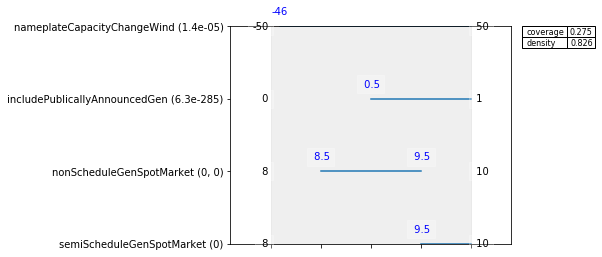

In [184]:
#%matplotlib inline
selected_box = 7

box_1 = box1.inspect(selected_box)
box_1 = box1.inspect(selected_box, style='graph')


### BAU VS JT

## Direct search: PRIM Sustainable Transition (ST)

In [110]:
from EMAworkbench.ema_workbench.analysis import prim
from EMAworkbench.ema_workbench.util import ema_logging
ema_logging.log_to_stderr(ema_logging.INFO);

x = exp
"""
Paris trajectory to 2 C
Filter by GHG (below 32% value of 2005 by 2025)
Filter by GHG (below 45% value of 2005 by 2030)
Filter by net zero GHGE by 2050
"""    
ooi = 'GHGYear'

reference = bau_results_df[bau_results_df['Time (Year)'] == 2005]['GHGYear'].values

reduction = 0.32
ylc_e1 = target_at_year( outcomes_filtered, ooi, 2025, reference - (reference * reduction), False) #False is below target

reduction = 0.45
ylc_e2 = target_at_year( outcomes_filtered, ooi, 2030, reference - (reference * reduction), False) #False is below target

## Net zero
ylc_e3 = target_at_year( outcomes_filtered, ooi, 2050, 5, False) #False is below target

ylc_e = ylc_e1 &  ylc_e2 & ylc_e3 

"""
Filter by renewableContributionYear (above 50%)
The Victorian Renewable Energy Targets (VRET) https://www.energy.vic.gov.au/renewable-energy/victorias-renewable-energy-targets
25% of electricity generated from RE by 2020
40% by 2025
50% by 2030

"""

ooi = 'renewableContributionYear'    

ylc_re1 = target_at_year( outcomes_filtered, ooi, 2025, 0.40, True) #False is below target
ylc_re2 = target_at_year( outcomes_filtered, ooi, 2030, 0.50, True) #False is below target


ylc_re= ylc_re1 & ylc_re2

""""
Filter by GA of Primary Wholesale Market (below 70% value of 2019, which is the year with Max unmet demand per hour)
"""

ooi = 'unmetPercentageConsumptionPrimary'    

ylct_gap1 = target_at_year( outcomes_filtered, ooi, 2030, 2, False) #False is below target
ylct_gap2 = target_at_year( outcomes_filtered, ooi, 2040, 5, False) #False is below target
ylct_gap3 = target_at_year( outcomes_filtered, ooi, 2050, 40, False) #False is below target

ylct_gap = ylct_gap1 & ylct_gap2 & ylct_gap3

"""
Filter by Energy Vulnerability (below 70% of 2017 value)
"""
ooi = 'Energy Vulnerability Percentage'    

yjt_ev1= target_at_year( outcomes_filtered, ooi, 2030, 0.300779648, False) #False is below target


""""
Filter by GA of Primary Wholesale Market (below 70% value of 2019, which is the year with Max unmet demand per hour)
"""

ooi = 'unmetPercentageConsumptionSecondary'    

yjt_gas1 = target_at_year( outcomes_filtered, ooi, 2040, 50, False) #False is below target
yjt_gas2 = target_at_year( outcomes_filtered, ooi, 2040, 0.001, True)

yjt_gas = yjt_gas1 & yjt_gas2
# """
# Combine Filters
# """
y = ylc_e & ylc_re & yjt_ev1 &  ylct_gap &  yjt_gas

"""
Run PRIM
"""
prim_alg = prim.Prim(x, y, threshold=0.1, threshold_type=prim.ABOVE)
box1 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 126001 points remaining, containing 3574 cases of interest
C:\Users\angel\Documents\GitHub\gr4sp\experiments\EMAworkbench\ema_workbench\analysis\prim.py:1198: RuntimeWarning:

invalid value encountered in less_equal

C:\Users\angel\Documents\GitHub\gr4sp\experiments\EMAworkbench\ema_workbench\analysis\prim.py:1195: RuntimeWarning:

invalid value encountered in greater_equal

[MainProcess/INFO] mean: 0.48823437743493847, mass: 0.05092816723676796, coverage: 0.8766088416340235, density: 0.48823437743493847 restricted_dimensions: 4


In [111]:
box1.inspect_tradeoff()

alt.VConcatChart(...)

coverage     0.594396
density      0.578463
id                  6
mass        0.0509282
mean         0.578463
res_dim             4
Name: 6, dtype: object

                              box 6                                     
                                min   max                      qp values
generatorRetirement            -5.0   4.5  [-1.0, 7.192045596684475e-17]
includePublicallyAnnouncedGen   0.5   1.0                    [0.0, -1.0]
semiScheduleGenSpotMarket       9.5  10.0                    [0.0, -1.0]
nonScheduleGenSpotMarket        8.5   9.5                     [0.0, 0.0]



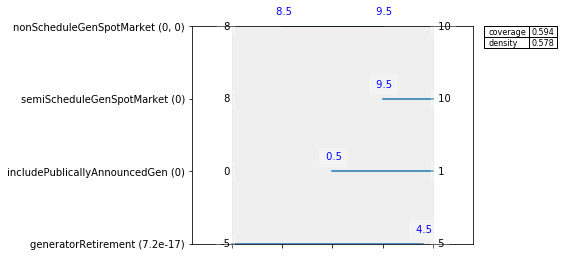

In [172]:
#%matplotlib inline
selected_box = 6

box_1 = box1.inspect(selected_box)
box_1 = box1.inspect(selected_box, style='graph')


### BAU vs ST

### Feature Scoring

In [20]:
from EMAworkbench.ema_workbench.analysis import feature_scoring

fs, alg = feature_scoring.get_ex_feature_scores(x, y, mode=feature_scoring.RuleInductionType.CLASSIFICATION)
fs.sort_values(ascending=False, by=1)


,1
0,
generatorRetirement,0.231507
semiScheduleGenSpotMarket,0.220452
consumption,0.085820
includePublicallyAnnouncedGen,0.080848
generationRolloutPeriod,0.066415
priceChangePercentageWater,0.036840
annualInflation,0.035610
semiScheduleMinCapMarketGen,0.019934
energyEfficiency,0.019555


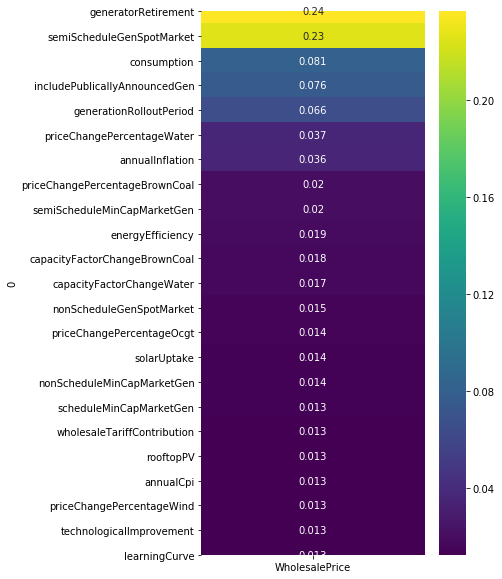

In [21]:
x = exp
y_all = {}

#plot using ALL simulations
#y_all['GHGYear'] = data

#plot using average of ALL simulations
#y_all['GHGYear'] = out_avg_ooi

#Plot using only target simulations
y_all['WholesalePrice'] = y

fig, ax = plt.subplots(figsize=(5,10))
fs = feature_scoring.get_feature_scores_all(x, y_all)
sns.heatmap(fs, cmap='viridis', annot=True, ax=ax)
plt.show()

### Dimensional stacking

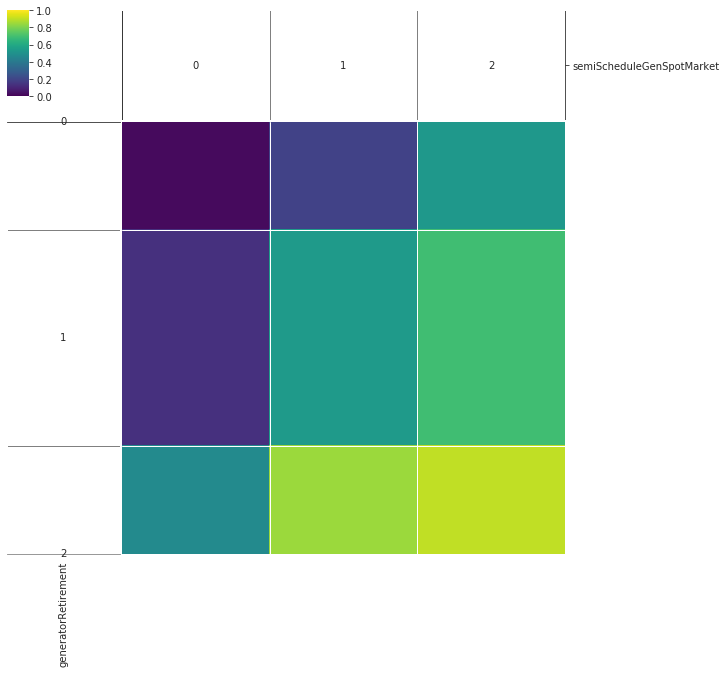

In [22]:

from EMAworkbench.ema_workbench.analysis import dimensional_stacking

x = exp
dimensional_stacking.create_pivot_plot(x,y, 1, nbins=3)
plt.show()



In [30]:
from EMAworkbench.ema_workbench.analysis import prim
from EMAworkbench.ema_workbench.util import ema_logging
ema_logging.log_to_stderr(ema_logging.INFO);
 
x = exp
#y = out_avg_ooi > 80

y = target_at_year( outcomes_filtered, ooi, 2040, 50, False) #False is below target

prim_alg = prim.Prim(x, y, threshold=.35, threshold_type=prim.ABOVE)
box1 = prim_alg.find_box()

[MainProcess/INFO] 49153 points remaining, containing 2338 cases of interest
[MainProcess/INFO] mean: 0.409373060211049, mass: 0.06555042418570586, coverage: 0.5641573994867408, density: 0.409373060211049 restricted_dimensions: 8


In [31]:
box1.inspect_tradeoff()

alt.VConcatChart(...)

In [ ]:
%matplotlib inline
box_1 = box1.inspect(3)
box_1 = box1.inspect(13, style='graph')


In [ ]:
box1.select(13)
fig = box1.show_pairs_scatter(13)

plt.show()

### Feature Scoring

In [ ]:
from EMAworkbench.ema_workbench.analysis import feature_scoring

fs, alg = feature_scoring.get_ex_feature_scores(x, y, mode=feature_scoring.RuleInductionType.CLASSIFICATION)
fs.sort_values(ascending=False, by=1)


In [ ]:
x = exp
y_all = {}

#plot using ALL simulations
#y_all['GHGYear'] = data

#plot using average of ALL simulations
#y_all['GHGYear'] = out_avg_ooi

#Plot using only target simulations
y_all['WholesalePrice'] = y

fig, ax = plt.subplots(figsize=(5,10))
fs = feature_scoring.get_feature_scores_all(x, y_all)
sns.heatmap(fs, cmap='viridis', annot=True, ax=ax)
plt.show()

### Dimensional stacking

In [ ]:

from EMAworkbench.ema_workbench.analysis import dimensional_stacking

x = exp
dimensional_stacking.create_pivot_plot(x,y, 1, nbins=3)
plt.show()



## Tariffs

#### Filter trajectories away from the BAU

In [113]:
filter_below = target_at_year( outcomes_filtered, ooi, 2000, 30, False) #True means above target
#outcomes_filtered = {k:v[:, startYearShift:] for k,v in outcomes.items() if k != 'seedExperimentCsv'}

outcomes_bau_cluster = {k:v[filter_below, :] for k,v in outcomes_filtered.items()}

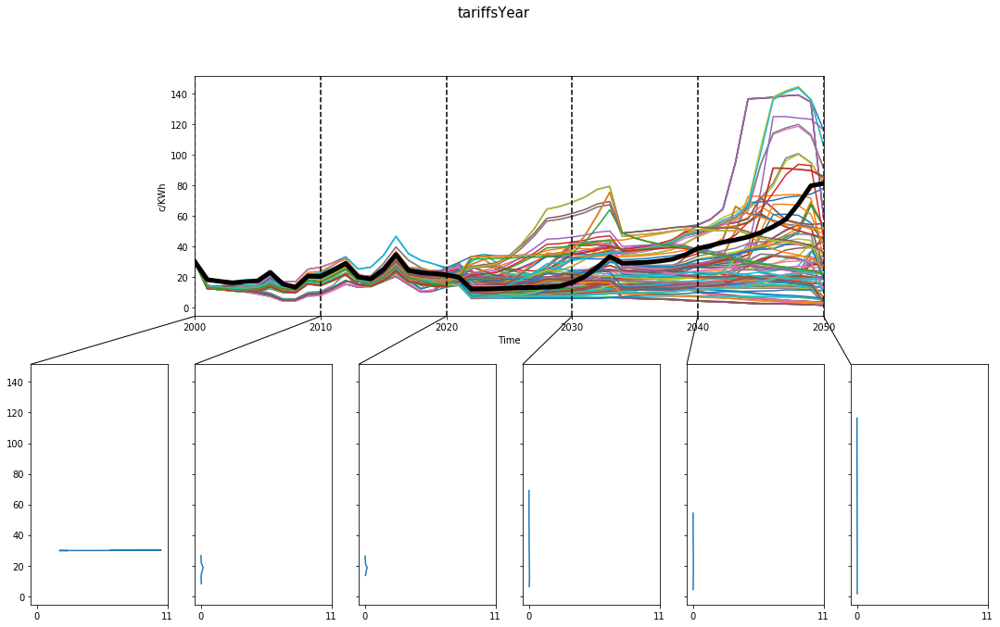

In [114]:
from EMAworkbench.ema_workbench.analysis.plotting import multiple_densities, PlotType
from EMAworkbench.ema_workbench.analysis.plotting_util import Density 

fig, ax_env = multiple_densities(experiments, outcomes_bau_cluster, outcomes_to_show = ooi,
                                 points_in_time=points_of_interest, density = Density.KDE, grouping_specifiers=None, 
                                 titles={ooi}, ylabels={ooi: "c/KWh"}, legend=True,
                                 fill=False, plot_type=PlotType.ENV_LIN)

#Change x labels to years
ax_env[ooi]['main plot'].set_xticklabels(time[range(0,len(time),10)])

#Add BAU in the plot with a gray wide line
ax_env[ooi]['main plot'].plot(outcomes_filtered[ooi][-1], 'k-',linewidth=5 )

## Show labels
# labels = ax_env['F']['main plot'].get_xticklabels()
# for l in labels:
#     print (l.get_text)

fig[0].suptitle("{}".format(ooi), fontsize=15)
fig[0].set_size_inches(18.5, 10.5)

plt.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', 'filtered_envelope_line_density_%s'%(ooi)),
                dpi=300, bbox_inches='tight')

Densities (PDF): {'29.8 to 30.0': '0.206', '30.0 to 30.1': '0.447', '30.1 to 30.3': '0.477', '30.3 to 30.4': '1.029', '30.4 to 30.6': '0.792', '30.6 to 30.7': '0.991', '30.7 to 30.9': '0.926', '30.9 to 31.0': '0.813', '31.0 to 31.2': '0.600', '31.2 to 31.3': '0.294', '31.3 to 31.5': '0.109'}
% in Bin: {'29.8 to 30.0': '3.1%', '30.0 to 30.1': '6.7%', '30.1 to 30.3': '7.1%', '30.3 to 30.4': '15.4%', '30.4 to 30.6': '11.9%', '30.6 to 30.7': '14.8%', '30.7 to 30.9': '13.9%', '30.9 to 31.0': '12.2%', '31.0 to 31.2': '9.0%', '31.2 to 31.3': '4.4%', '31.3 to 31.5': '1.6%'}

Densities (PDF): {'8.1 to 17.8': '0.040', '17.8 to 27.5': '0.052', '27.5 to 37.2': '0.004', '37.2 to 46.9': '0.001', '56.6 to 66.3': '0.002', '95.5 to 105.2': '0.001'}
% in Bin: {'8.1 to 17.8': '38.9%', '17.8 to 27.5': '50.7%', '27.5 to 37.2': '3.9%', '37.2 to 46.9': '1.0%', '46.9 to 56.6': '0.3%', '56.6 to 66.3': '1.7%', '66.3 to 76.1': '0.9%', '76.1 to 85.8': '0.7%', '85.8 to 95.5': '0.5%', '95.5 to 105.2': '1.2%', '105.

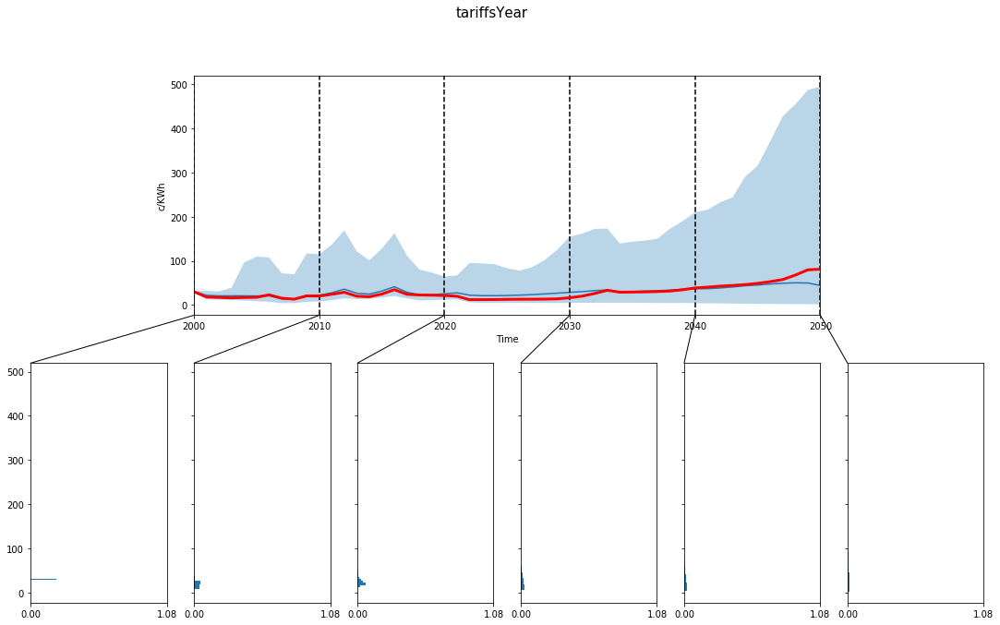

In [115]:
from EMAworkbench.ema_workbench.analysis.plotting import multiple_densities, PlotType
from EMAworkbench.ema_workbench.analysis.plotting_util import Density

# fig, ax_env = multiple_densities(experiments, outcomes_filtered, outcomes_to_show = ooi,
#                                  points_in_time=points_of_interest,  density = Density.HIST,
#                                  grouping_specifiers=None , titles={ooi}, ylabels={ooi: "$/MWh"}, legend=True,
#                                  fill=True, plot_type=PlotType.ENVELOPE)

fig, ax_env = multiple_densities(experiments, outcomes_filtered, outcomes_to_show = ooi,
                                 points_in_time=points_of_interest,  density = Density.HIST,
                                 grouping_specifiers=None , titles={ooi}, ylabels={ooi: "c/KWh"}, legend=True,
                                 fill=True, plot_type=PlotType.ENVELOPE)

#Change x labels to years
ax_env[ooi]['main plot'].set_xticklabels(time[range(0,len(time),10)])
#Add BAU in the plot with a red wide line
ax_env[ooi]['main plot'].plot(outcomes_filtered[ooi][-1], 'r-',linewidth=3 )

fig[0].suptitle("{}".format(ooi), fontsize=15)
fig[0].set_size_inches(18.5, 10.5)

plt.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', '_envelope_density_%s'%(ooi)),
                dpi=300, bbox_inches='tight')



In [106]:
from EMAworkbench.ema_workbench.analysis import prim
from EMAworkbench.ema_workbench.util import ema_logging
ema_logging.log_to_stderr(ema_logging.INFO);

x = exp
"""
Filter by GHG
"""    
ooi = 'GHGYear'
#y = (out_avg_ooi < 4.)
#y = target_at_year( outcomes_filtered, ooi, 2030, 24, False) #False is below target
y1 = target_at_year( outcomes_filtered, ooi, 2030, 25, False) #False is below target

"""
Filter by Wholesale price
"""

ooi = 'wholesalePriceYear'    

#y = out_avg_ooi > 20

y2 = target_at_year( outcomes_filtered, ooi, 2030, 50, False) #False is below target
#y = target_at_year( outcomes_filtered, ooi, 2030, 21, False) #False is below target

"""
Filter by Tariff
"""

ooi = 'tariffsYear'    

#y = out_avg_ooi > 20

y3 = target_at_year( outcomes_filtered, ooi, 2030, 21, False) #False is below target
#y = target_at_year( outcomes_filtered, ooi, 2030, 21, False) #False is below target

"""
Combine Filters
"""
y = y1 & y2 & y3

"""
Run PRIM
"""
prim_alg = prim.Prim(x, y, threshold=0.1, threshold_type=prim.ABOVE)
box1 = prim_alg.find_box()

TypeError: '<' not supported between instances of 'int' and 'str'

In [52]:
box1.inspect_tradeoff()

alt.VConcatChart(...)

coverage     0.68629
density     0.139111
id                32
mass        0.129575
mean        0.139111
res_dim           11
Name: 32, dtype: object

                                   box 32             \
                                      min        max   
priceChangePercentageWind      -30.000000  12.500000   
annualInflation                  0.010020   0.040781   
priceChangePercentageWater     -30.000000  23.500000   
capacityFactorChangeBrownCoal  -10.000000   8.500000   
technologicalImprovement         0.000049   0.095996   
wholesaleTariffContribution     29.500000  45.000000   
priceChangePercentageBrownCoal -23.500000  30.000000   
generationRolloutPeriod          0.500000  10.000000   
annualCpi                        0.011992   0.049980   
learningCurve                    0.004395   0.099951   
scheduleMinCapMarketGen         10.500000  30.000000   

                                                                
                                                     qp

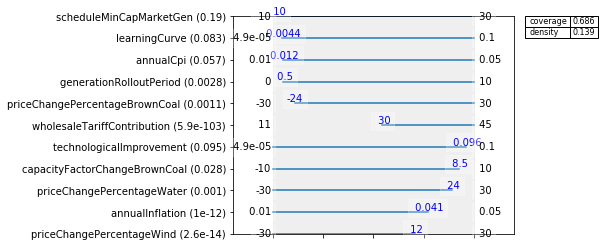

In [53]:
%matplotlib inline
box_1 = box1.inspect(32)
box_1 = box1.inspect(32, style='graph')

### Dimensional stacking

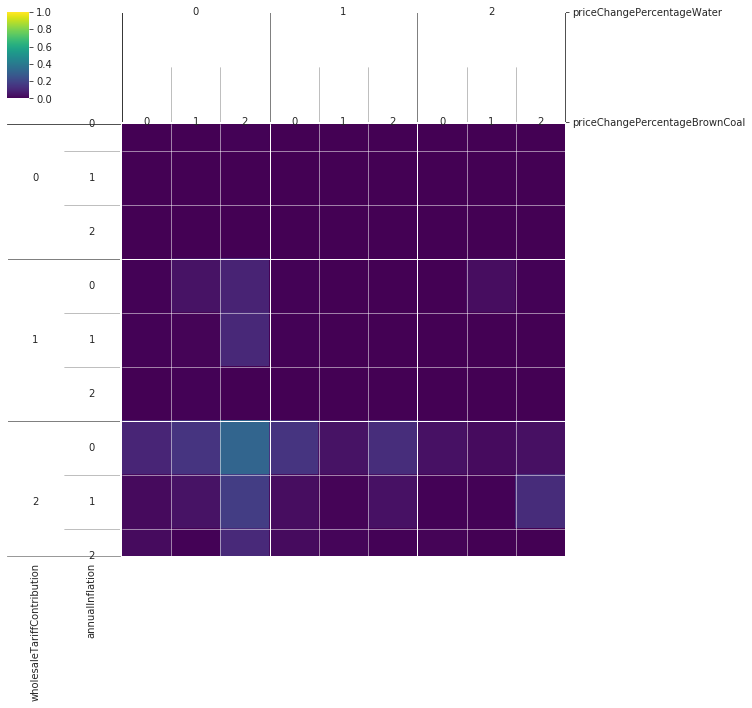

In [56]:

from EMAworkbench.ema_workbench.analysis import dimensional_stacking

x = exp
dimensional_stacking.create_pivot_plot(x,y, 2, nbins=3)
plt.show()



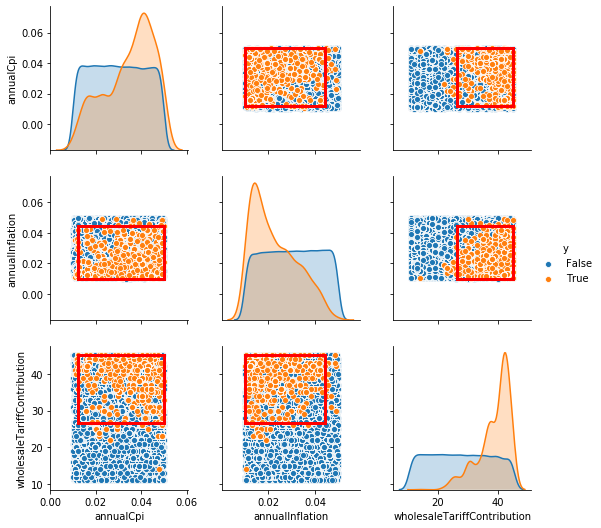

In [55]:
box1.select(12)
fig = box1.show_pairs_scatter(12)
plt.show()

In [98]:
## Primary Spot Production

In [73]:
from EMAworkbench.ema_workbench.analysis import prim
from EMAworkbench.ema_workbench.util import ema_logging
ema_logging.log_to_stderr(ema_logging.INFO);
 
"""
Filter by GHG
"""    
#ooi = 'GHGYear'
#y = (out_avg_ooi < 4.)
#y = target_at_year( outcomes_filtered, ooi, 2030, 24, False) #False is below target
#y1 = target_at_year( outcomes_filtered, ooi, 2020, 38, False) #False is below target

"""
Filter by Tariff
"""

ooi = 'tariffsYear'    
x = exp
#y = out_avg_ooi > 20

#y2 = target_at_year( outcomes_filtered, ooi, 2030, 50, True) #False is below target
y = target_at_year( outcomes_filtered, ooi, 2030, 21, False) #False is below target

"""
Combine Filters
"""
#y = y1 & y2

"""
Run PRIM
"""
prim_alg = prim.Prim(x, y, threshold=0.5, threshold_type=prim.ABOVE)
box1 = prim_alg.find_box()

[MainProcess/INFO] 49153 points remaining, containing 10491 cases of interest
C:\Users\angel\Documents\GitHub\gr4sp\experiments\EMAworkbench\ema_workbench\analysis\scenario_discovery_util.py:226: RuntimeWarning:

invalid value encountered in less_equal

C:\Users\angel\Documents\GitHub\gr4sp\experiments\EMAworkbench\ema_workbench\analysis\scenario_discovery_util.py:227: RuntimeWarning:

invalid value encountered in less_equal

C:\Users\angel\Documents\GitHub\gr4sp\experiments\EMAworkbench\ema_workbench\analysis\scenario_discovery_util.py:306: RuntimeWarning:

invalid value encountered in long_scalars

C:\Users\angel\Anaconda3\lib\site-packages\scipy\stats\_discrete_distns.py:47: RuntimeWarning:

invalid value encountered in greater_equal

C:\Users\angel\Anaconda3\lib\site-packages\scipy\stats\_discrete_distns.py:47: RuntimeWarning:

invalid value encountered in less_equal

C:\Users\angel\Documents\GitHub\gr4sp\experiments\EMAworkbench\ema_workbench\analysis\prim.py:1198: RuntimeWarning:

AssertionError: 

In [52]:
box1.inspect_tradeoff()

alt.VConcatChart(...)

coverage    0.624395
density     0.848195
id                11
mass        0.325128
mean        0.848195
res_dim            3
Name: 11, dtype: object

                            box 11                                     
                               min   max                      qp values
semiScheduleGenSpotMarket      8.0   9.5                    [-1.0, 0.0]
priceChangePercentageWind    -30.0  27.5  [-1.0, 0.0006427886079691778]
wholesaleTariffContribution   27.5  45.0                    [0.0, -1.0]



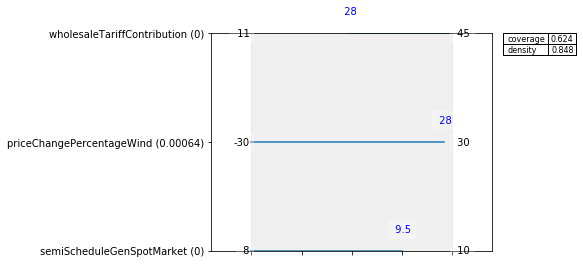

In [47]:
%matplotlib inline
box_1 = box1.inspect(11)
box_1 = box1.inspect(11, style='graph')

### Dimensional stacking

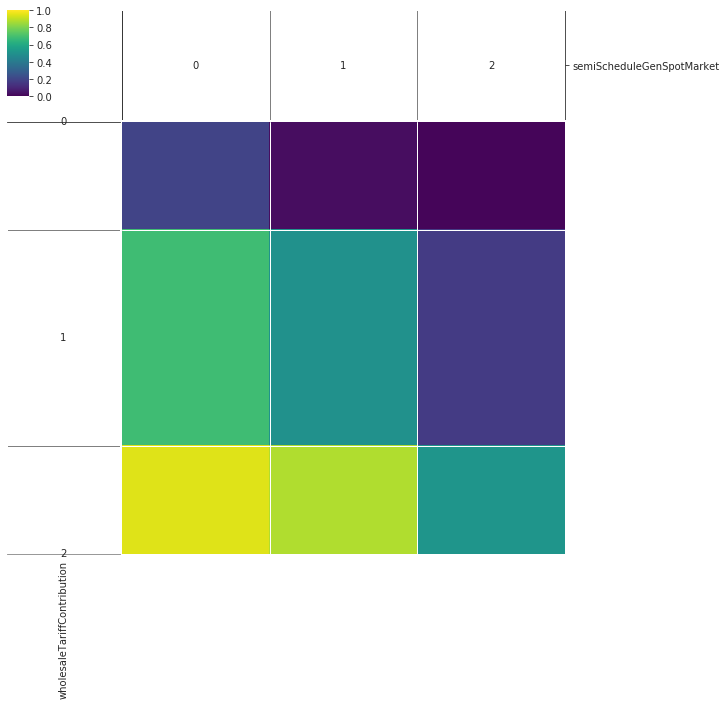

In [49]:

from EMAworkbench.ema_workbench.analysis import dimensional_stacking

x = exp
dimensional_stacking.create_pivot_plot(x,y, 1, nbins=3)
plt.show()



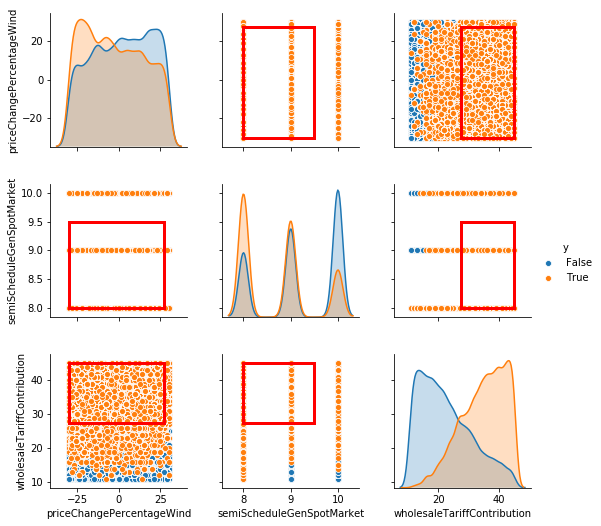

In [50]:
box1.select(11)
fig = box1.show_pairs_scatter(11)
plt.show()

In [169]:
# Subset Sool levers
selected_uncertainties = uncertainties

ooi = 'secondaryMaxUnmetDemandMwhPerHour'
data = outcomes_filtered[ooi]

num_exp = len(data)
out_avg_ooi = np.zeros(num_exp)

for i in range(num_exp):
    out_avg_ooi[i] = data[i].mean()

exp = pd.DataFrame(experiments)

exp = exp.loc[ :, selected_uncertainties] 

### Open Exploration: Visual Analysis

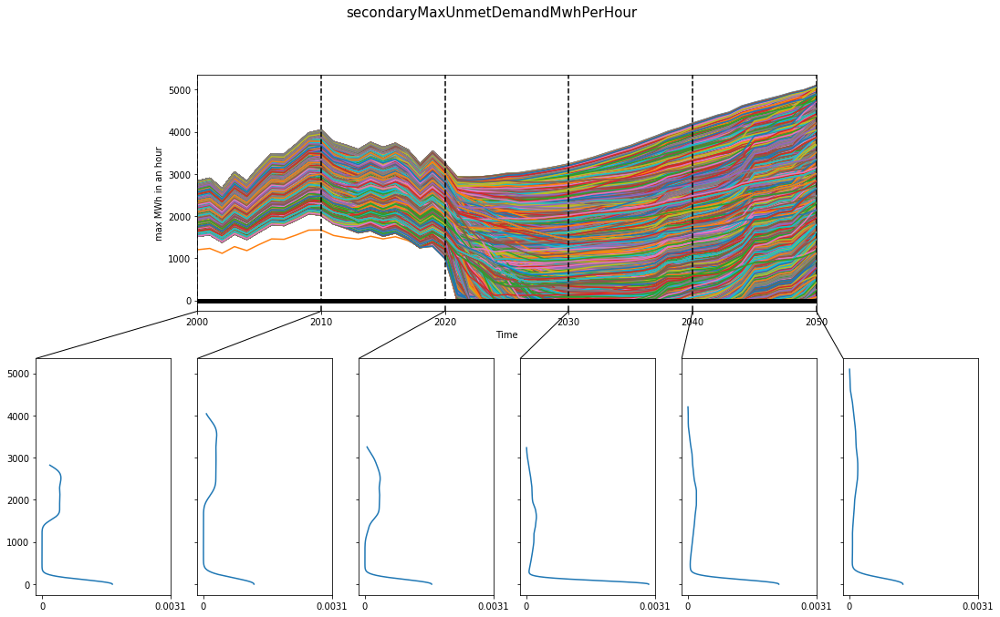

In [170]:
from EMAworkbench.ema_workbench.analysis.plotting import multiple_densities, PlotType
from EMAworkbench.ema_workbench.analysis.plotting_util import Density

fig, ax_env = multiple_densities(experiments, outcomes_filtered, outcomes_to_show = ooi,
                                 points_in_time=points_of_interest,  density = Density.KDE,
                                 grouping_specifiers=None , titles={ooi}, ylabels={ooi: "max MWh in an hour"}, legend=True,
                                 fill=False, plot_type=PlotType.ENV_LIN)

#Change x labels to years
ax_env[ooi]['main plot'].set_xticklabels(time[range(0,len(time),10)])
#Add BAU in the plot with a black wide line
ax_env[ooi]['main plot'].plot(outcomes_filtered[ooi][-1], 'k-',linewidth=5 )

fig[0].suptitle("{}".format(ooi), fontsize=15)
fig[0].set_size_inches(18.5, 10.5)

plt.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', '_envelope_line_density_%s'%(ooi)),
                dpi=300, bbox_inches='tight')

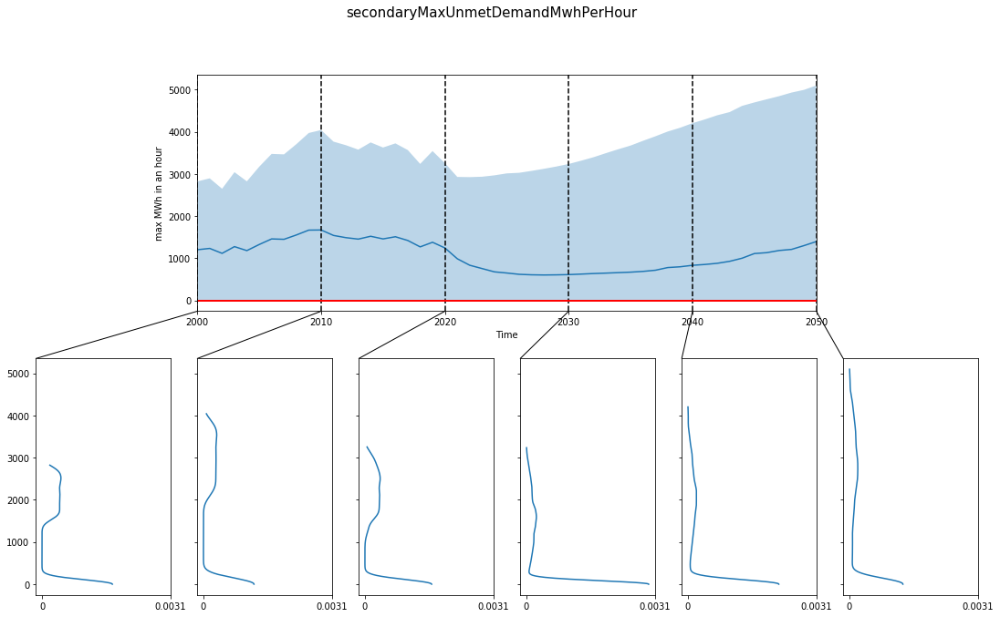

In [171]:
from EMAworkbench.ema_workbench.analysis.plotting import multiple_densities, PlotType
from EMAworkbench.ema_workbench.analysis.plotting_util import Density

fig, ax_env = multiple_densities(experiments, outcomes_filtered, outcomes_to_show = ooi,
                                 points_in_time=points_of_interest,  density = Density.KDE,
                                 grouping_specifiers=None , titles={ooi}, ylabels={ooi: "max MWh in an hour"}, legend=True,
                                 fill=True, plot_type=PlotType.ENVELOPE)

#Change x labels to years
ax_env[ooi]['main plot'].set_xticklabels(time[range(0,len(time),10)])
#Add BAU in the plot with a red wide line
ax_env[ooi]['main plot'].plot(outcomes_filtered[ooi][-1], 'r-',linewidth=2 )

fig[0].suptitle("{}".format(ooi), fontsize=15)
fig[0].set_size_inches(18.5, 10.5)

plt.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', '_envelope_density_%s'%(ooi)),
                dpi=300, bbox_inches='tight')

In [ ]:
from EMAworkbench.ema_workbench.analysis import prim
from EMAworkbench.ema_workbench.util import ema_logging
ema_logging.log_to_stderr(ema_logging.INFO);
 
x = exp
#y = out_avg_ooi > 40000000
y = target_at_year( outcomes_filtered, ooi, 2035, 40000000, False) #False is below target

prim_alg = prim.Prim(x, y, threshold=0.3)
box1 = prim_alg.find_box()

In [ ]:
box1.inspect_tradeoff()

In [ ]:
%matplotlib inline
box_1 = box1.inspect(2)
box_1 = box1.inspect(2, style='graph')

In [ ]:
box1.select(2)
fig = box1.show_pairs_scatter(2)
plt.show()